In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import os
import fastparquet
import geopandas as gpd

In [2]:
%matplotlib inline
pd.set_option('display.max_columns', None)

In [3]:
path="F:/1_Bachelorarbeit/1_Daten/1_Yellow_Cab_Trips_2009-June_2016/5_Dataset_for_Exploration/Exploration_Tripdata_for_Bivariate.parquet"
# Testing the Parquet Files
df=pd.read_parquet(path=path,engine="fastparquet")
df

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff
index,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,0,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,0,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,0,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,0,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,0,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,0,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,0,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,0,9.000000,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,0,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan


In [4]:
gdf=gpd.GeoDataFrame(df)

In [5]:
gdf.head()

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff
index,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,0,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,0,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,0,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,0,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,0,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan


In [6]:
gdf.describe()

,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,LocationID_pickup,Dropoff_Lon,Dropoff_Lat,LocationID_dropoff
count,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06
mean,1.687247e+00,2.914142e+00,-7.397531e+01,4.075091e+01,8.960968e-01,1.138768e+01,1.607228e+02,-7.397456e+01,4.075137e+01,1.589840e+02
std,1.309663e+00,3.924014e+01,3.451246e-02,2.674579e-02,3.830549e-01,8.903463e+00,6.637132e+01,3.309852e-02,3.064235e-02,6.929549e+01
min,1.000000e+00,6.000519e-03,-7.423065e+01,4.051488e+01,0.000000e+00,2.900391e+00,1.000000e+00,-7.424289e+01,4.050939e+01,1.000000e+00
25%,1.000000e+00,1.040039e+00,-7.399223e+01,4.073675e+01,1.000000e+00,6.101562e+00,1.130000e+02,-7.399150e+01,4.073568e+01,1.070000e+02
50%,1.000000e+00,1.769531e+00,-7.398209e+01,4.075344e+01,1.000000e+00,8.500000e+00,1.610000e+02,-7.398052e+01,4.075397e+01,1.610000e+02
75%,2.000000e+00,3.199219e+00,-7.396838e+01,4.076765e+01,1.000000e+00,1.300000e+01,2.310000e+02,-7.396518e+01,4.076854e+01,2.310000e+02
max,6.000000e+00,4.499200e+04,-7.371025e+01,4.091128e+01,6.000000e+00,5.000000e+02,2.630000e+02,-7.370098e+01,4.091288e+01,2.630000e+02


In [7]:
gdf.dtypes

Pickup_DateTime       datetime64[ns]
Dropoff_DateTime      datetime64[ns]
Passenger_Count                uint8
Trip_Distance                float32
Pickup_Lon                   float32
Pickup_Lat                   float32
RateCodeID                     uint8
Fare_Amt                     float32
geometry_pickup               object
zone_pickup                   object
LocationID_pickup             uint16
borough_pickup                object
Dropoff_Lon                  float32
Dropoff_Lat                  float32
geometry_dropoff              object
zone_dropoff                  object
LocationID_dropoff            uint16
borough_dropoff               object
dtype: object

In [8]:
gdf.shape

(1915832, 18)

## Theory and Hypothesis

### 1. The Fare should increase if the travelled Distance is longer

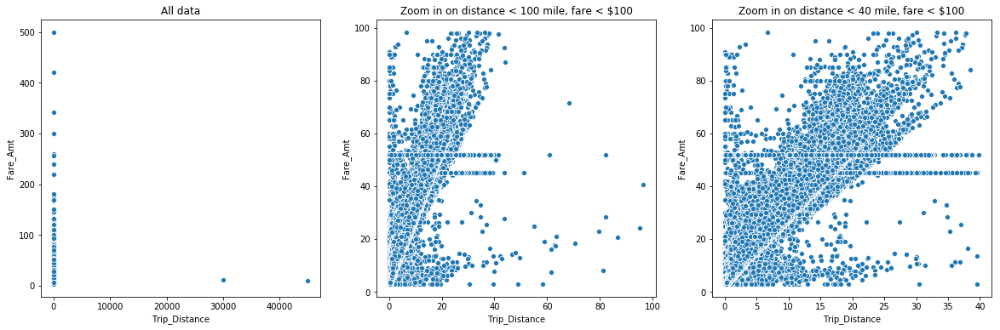

In [9]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0])
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1])
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2])
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1. There are trips with small distances but with high fares. (Outliers) -> Maybe because of Traffic? 
#### 2. There are Trips with high distances but with low Fare Amount. (Outliers) or maybe Discount? -> 
#### 3. There are 2 horizontal Lines -> indicator for Manhattan_JFK Airport Trips maybe? , because Manhattan_JFK Airport Trips have Fixed Fees
#### 4. But overall there seems to be a (linear) relation between distance and fare

### How many Trips are Airport Trips?

In [10]:
Newark_Airport_Len=len(gdf[(gdf["zone_pickup"]=="Newark Airport") | (gdf["zone_dropoff"]=="Newark Airport")])
print("Newark_Airport_Trips:"+str(Newark_Airport_Len))
JFK_Airport_Len=len(gdf[(gdf["zone_pickup"]=="JFK Airport") | (gdf["zone_dropoff"]=="JFK Airport")])
print("JFK_Airport_Trips:"+str(JFK_Airport_Len))
LaGuardia_Airport_Len=len(gdf[(gdf["zone_pickup"]=="LaGuardia Airport") | (gdf["zone_dropoff"]=="LaGuardia Airport")])
print("LaGuardia_Airport_Trips:"+str(LaGuardia_Airport_Len))
print("\n")
Airport_Trips=Newark_Airport_Len+JFK_Airport_Len+LaGuardia_Airport_Len
print("Total Airport Trips:"+ str(Airport_Trips))
print("\n")
print(str((Airport_Trips/len(gdf))*100)+" "+"% are Airport Trips")

Newark_Airport_Trips:2591
JFK_Airport_Trips:43813
LaGuardia_Airport_Trips:63626


Total Airport Trips:110030


5.743196689480079 % are Airport Trips


In [11]:
# Create Column Airport Trips with boolean values to show if trip is Airport Trip or not
gdf["Airport_Trip"]=False
gdf.loc[(gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport") | (gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport") | (gdf['zone_pickup'] == "Newark Airport") | (gdf['zone_dropoff'] == "Newark Airport"),['Airport_Trip']] = True

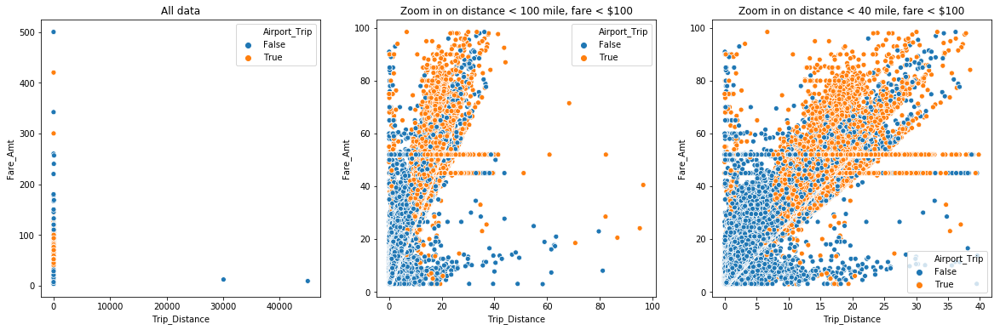

In [12]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2],hue="Airport_Trip")
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1.The most Airport Trips are expensive

In [13]:
# Trips between JFK and Manhatten
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf["Manhattan_JFK_Airport_Trip"]=False
gdf.loc[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) ,['Manhattan_JFK_Airport_Trip']] = True

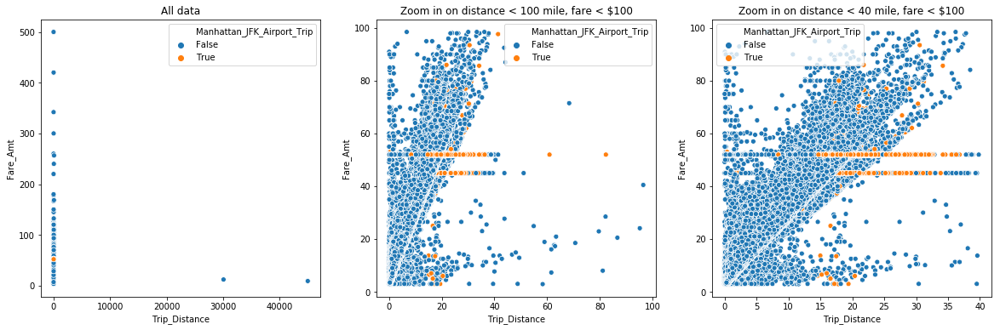

In [14]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2],hue="Manhattan_JFK_Airport_Trip")
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1. There are Airport Trips between Manhattan and JFK, which are not the Flat Fares like 45 Dollar or 52 Dollar

#### Since July 1st 2012 the Flat Fare between JFK and Manhattan changed from 45 Dollars to 52 Dollars
#### For more Information go to: [Flat Fare](https://www.new-york-city-travel-tips.com/how-transfer-between-jfk-airport-manhattan/)

In [15]:
# Show Dataframe with Manhattan_JFK Trips
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan"))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
94,2009-03-02 15:02:00,2009-03-02 15:34:00,1,17.015625,-73.786018,40.645683,0,45.000,POINT (-73.78601837158203 40.64568328857422),JFK Airport,132,Queens,-73.964195,40.754452,POINT (-73.96419525146484 40.75445175170898),Sutton Place/Turtle Bay North,229,Manhattan,True,True
317,2009-12-24 11:06:00,2009-12-24 11:40:00,1,21.500000,-74.012398,40.707981,0,45.000,POINT (-74.01239776611328 40.70798110961914),World Trade Center,261,Manhattan,-73.776283,40.645817,POINT (-73.77628326416016 40.64581680297852),JFK Airport,132,Queens,True,True
554,2009-05-08 06:37:05,2009-05-08 07:27:29,1,18.296875,-73.776787,40.645454,0,45.000,POINT (-73.77678680419922 40.64545440673828),JFK Airport,132,Queens,-73.982147,40.722534,POINT (-73.98214721679688 40.7225341796875),Alphabet City,4,Manhattan,True,True
591,2009-12-19 04:00:34,2009-12-19 04:27:31,1,17.703125,-73.986252,40.758804,0,45.000,POINT (-73.98625183105469 40.75880432128906),Times Sq/Theatre District,230,Manhattan,-73.782516,40.648846,POINT (-73.78251647949219 40.64884567260742),JFK Airport,132,Queens,True,True
704,2009-08-08 11:06:00,2009-08-08 11:48:00,5,19.234375,-73.990150,40.746384,0,45.000,POINT (-73.99015045166016 40.74638366699219),Midtown South,164,Manhattan,-73.794220,40.644627,POINT (-73.79421997070313 40.64462661743164),JFK Airport,132,Queens,True,True
782,2009-02-25 17:46:00,2009-02-25 18:22:00,3,17.828125,-73.788101,40.647339,0,45.000,POINT (-73.78810119628906 40.6473388671875),JFK Airport,132,Queens,-73.974548,40.737507,POINT (-73.97454833984375 40.73750686645508),Kips Bay,137,Manhattan,True,True
1085,2009-12-02 12:11:09,2009-12-02 12:41:42,1,19.000000,-73.955482,40.767742,0,45.000,POINT (-73.95548248291016 40.76774215698242),Lenox Hill East,140,Manhattan,-73.798897,40.645226,POINT (-73.79889678955078 40.64522552490234),JFK Airport,132,Queens,True,True
1126,2009-11-01 17:53:00,2009-11-01 18:32:00,1,16.515625,-73.989929,40.755947,0,45.000,POINT (-73.98992919921875 40.75594711303711),Garment District,100,Manhattan,-73.783188,40.643826,POINT (-73.78318786621094 40.64382553100586),JFK Airport,132,Queens,True,True
1345,2009-08-08 14:39:12,2009-08-08 15:21:04,1,16.500000,-73.999725,40.753750,0,45.000,POINT (-73.99972534179688 40.75374984741211),East Chelsea,68,Manhattan,-73.796066,40.644512,POINT (-73.79606628417969 40.64451217651367),JFK Airport,132,Queens,True,True


#### Observation:
#### 1. Flat Fare with RateCodeID = 0 -> should be RateCodeID=2 
#### 2. Negotiated Fares with RateCodeID 5 -> higher Fares than Flat Fare -> to trick unknown Customers for more Fare

In [16]:
# Show me Dataframe with Manhattan_JFK Trips which does not contain Flat Fares(45 Dollars and 52 Dollars)
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & ((gdf['Fare_Amt'] != 45.0) & (gdf['Fare_Amt'] != 52.0))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
2062,2009-08-07 12:45:41,2009-08-07 14:21:03,2,22.406250,-73.969925,40.784485,0,64.125000,POINT (-73.96992492675781 40.78448486328125),Central Park,43,Manhattan,-73.790215,40.646866,POINT (-73.79021453857422 40.64686584472656),JFK Airport,132,Queens,True,True
8781,2009-06-01 11:05:53,2009-06-01 11:49:58,1,15.296875,-73.977531,40.763733,0,39.687500,POINT (-73.97753143310547 40.76373291015625),Midtown North,163,Manhattan,-73.782059,40.644325,POINT (-73.78205871582031 40.64432525634766),JFK Airport,132,Queens,True,True
9271,2009-05-27 10:29:30,2009-05-27 12:02:05,1,0.700195,-73.984596,40.749691,0,18.906250,POINT (-73.98459625244141 40.74969100952148),Midtown South,164,Manhattan,-73.786110,40.645187,POINT (-73.78610992431641 40.64518737792969),JFK Airport,132,Queens,True,True
12907,2009-02-06 21:28:00,2009-02-06 22:03:00,2,24.234375,-73.790031,40.644291,0,52.906250,POINT (-73.79003143310547 40.64429092407227),JFK Airport,132,Queens,-73.974792,40.717007,POINT (-73.97479248046875 40.71700668334961),Two Bridges/Seward Park,232,Manhattan,True,True
14267,2009-07-25 10:53:03,2009-07-25 11:41:26,1,27.296875,-73.986382,40.747311,0,60.500000,POINT (-73.98638153076172 40.74731063842773),Midtown South,164,Manhattan,-73.776306,40.645424,POINT (-73.77630615234375 40.64542388916016),JFK Airport,132,Queens,True,True
16837,2009-05-17 05:27:35,2009-05-17 09:04:16,1,15.203125,-73.992004,40.731079,0,34.093750,POINT (-73.99200439453125 40.7310791015625),Greenwich Village North,113,Manhattan,-73.794395,40.656216,POINT (-73.79439544677734 40.65621566772461),JFK Airport,132,Queens,True,True
23045,2009-05-01 10:44:53,2009-05-01 15:41:12,1,1.099609,-73.786713,40.641151,0,5.300781,POINT (-73.78671264648438 40.64115142822266),JFK Airport,132,Queens,-73.974167,40.743690,POINT (-73.97416687011719 40.74369049072266),Kips Bay,137,Manhattan,True,True
24382,2009-07-07 16:16:00,2009-07-07 17:22:00,1,20.625000,-73.987267,40.730026,0,49.687500,POINT (-73.98726654052734 40.73002624511719),East Village,79,Manhattan,-73.790337,40.643810,POINT (-73.79033660888672 40.6438102722168),JFK Airport,132,Queens,True,True
24534,2009-12-05 15:06:14,2009-12-05 16:09:59,1,17.406250,-73.982826,40.769150,0,44.093750,POINT (-73.98282623291016 40.76914978027344),Lincoln Square East,142,Manhattan,-73.790176,40.643402,POINT (-73.79017639160156 40.64340209960938),JFK Airport,132,Queens,True,True


#### Observation:
#### 1. Fares with RateCodeID 0 -> Invalid RateCodeID's
#### 2. Fares with RateCodeID 5 -> Negotiated Fares -> higher Fares -> Taxi Driver has tricked some Customer
#### 3. Fares with RateCodeID 1 -> Standard Metered Fare -> Tricked some Customers for higher Fares

In [17]:
invalid_airport_trips=gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & ((gdf['Fare_Amt'] != 45.0) & (gdf['Fare_Amt'] != 52.0))]
print(str(len(invalid_airport_trips) /len(gdf)*100) +" "+ "% are invalid JFK_Mahattan Trips")

0.03006526668309121 % are invalid JFK_Mahattan Trips


#### Decision: Drop those invalid Trips, because they are just 0.03 % of the whole dataset

In [18]:
indexNames = gdf.loc[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & ((gdf['Fare_Amt'] != 45.0) & (gdf['Fare_Amt'] != 52.0))].index
gdf.drop(indexNames , inplace=True)

In [19]:
# Show Dataframe with Manhattan_JFK Trips and not RateCodeID2
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & (gdf['RateCodeID']!=2)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
94,2009-03-02 15:02:00,2009-03-02 15:34:00,1,17.015625,-73.786018,40.645683,0,45.0,POINT (-73.78601837158203 40.64568328857422),JFK Airport,132,Queens,-73.964195,40.754452,POINT (-73.96419525146484 40.75445175170898),Sutton Place/Turtle Bay North,229,Manhattan,True,True
317,2009-12-24 11:06:00,2009-12-24 11:40:00,1,21.500000,-74.012398,40.707981,0,45.0,POINT (-74.01239776611328 40.70798110961914),World Trade Center,261,Manhattan,-73.776283,40.645817,POINT (-73.77628326416016 40.64581680297852),JFK Airport,132,Queens,True,True
554,2009-05-08 06:37:05,2009-05-08 07:27:29,1,18.296875,-73.776787,40.645454,0,45.0,POINT (-73.77678680419922 40.64545440673828),JFK Airport,132,Queens,-73.982147,40.722534,POINT (-73.98214721679688 40.7225341796875),Alphabet City,4,Manhattan,True,True
591,2009-12-19 04:00:34,2009-12-19 04:27:31,1,17.703125,-73.986252,40.758804,0,45.0,POINT (-73.98625183105469 40.75880432128906),Times Sq/Theatre District,230,Manhattan,-73.782516,40.648846,POINT (-73.78251647949219 40.64884567260742),JFK Airport,132,Queens,True,True
704,2009-08-08 11:06:00,2009-08-08 11:48:00,5,19.234375,-73.990150,40.746384,0,45.0,POINT (-73.99015045166016 40.74638366699219),Midtown South,164,Manhattan,-73.794220,40.644627,POINT (-73.79421997070313 40.64462661743164),JFK Airport,132,Queens,True,True
782,2009-02-25 17:46:00,2009-02-25 18:22:00,3,17.828125,-73.788101,40.647339,0,45.0,POINT (-73.78810119628906 40.6473388671875),JFK Airport,132,Queens,-73.974548,40.737507,POINT (-73.97454833984375 40.73750686645508),Kips Bay,137,Manhattan,True,True
1085,2009-12-02 12:11:09,2009-12-02 12:41:42,1,19.000000,-73.955482,40.767742,0,45.0,POINT (-73.95548248291016 40.76774215698242),Lenox Hill East,140,Manhattan,-73.798897,40.645226,POINT (-73.79889678955078 40.64522552490234),JFK Airport,132,Queens,True,True
1126,2009-11-01 17:53:00,2009-11-01 18:32:00,1,16.515625,-73.989929,40.755947,0,45.0,POINT (-73.98992919921875 40.75594711303711),Garment District,100,Manhattan,-73.783188,40.643826,POINT (-73.78318786621094 40.64382553100586),JFK Airport,132,Queens,True,True
1345,2009-08-08 14:39:12,2009-08-08 15:21:04,1,16.500000,-73.999725,40.753750,0,45.0,POINT (-73.99972534179688 40.75374984741211),East Chelsea,68,Manhattan,-73.796066,40.644512,POINT (-73.79606628417969 40.64451217651367),JFK Airport,132,Queens,True,True


In [20]:
# Change RateCodeID of Manhattan_JFK_Trips all to 2
gdf.loc[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")),["RateCodeID"]]=2

In [21]:
# Show me Dataframe with Manhattan_JFK Trips which does not contain Flat Fares(45 Dollars and 52 Dollars)
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & ((gdf['Fare_Amt'] != 45.0) & (gdf['Fare_Amt'] != 52.0))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,


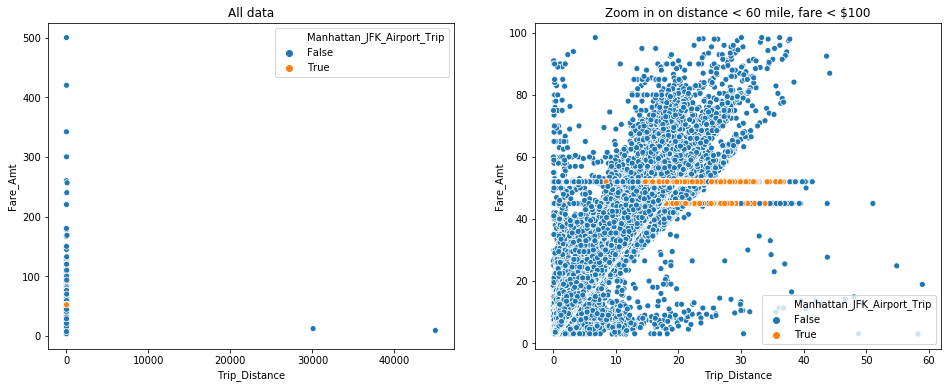

In [22]:
#Evidence that Manhattan_JFK Airport Trips are just Flat Fares
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

#### Observation:
#### 1. all Manhattan_JFK Airport Trips are around 45 and 50 Dollars
#### 2. Not all Fare Amount with 45 or 50 Dollars are Manhattan_JFK Airport Trips

#### Proof that Manhattan_JFK Trips has same Amount of RateCodeID 2

In [23]:
len(gdf.loc[gdf["Manhattan_JFK_Airport_Trip"]==True])

29243

In [24]:
len(gdf.loc[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) ])

29243

#### There are Trips which originate in Newark Airport

In [25]:
gdf.loc[(gdf['zone_pickup'] == "Newark Airport")]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
611,2009-06-24 14:52:25,2009-06-24 14:52:57,1,0.199951,-74.177170,40.694889,0,75.000000,POINT (-74.17716979980469 40.69488906860352),Newark Airport,1,EWR,-74.177345,40.695137,POINT (-74.17734527587891 40.69513702392578),Newark Airport,1,EWR,True,False
29648,2009-05-05 14:22:45,2009-05-05 14:27:39,1,1.200195,-74.177917,40.695469,0,6.898438,POINT (-74.17791748046875 40.69546890258789),Newark Airport,1,EWR,-74.177895,40.690575,POINT (-74.17789459228516 40.69057464599609),Newark Airport,1,EWR,True,False
44504,2009-03-01 02:55:00,2009-03-01 03:10:00,4,4.730469,-74.172623,40.693359,0,13.296875,POINT (-74.17262268066406 40.693359375),Newark Airport,1,EWR,-73.986763,40.717815,POINT (-73.98676300048828 40.71781539916992),Two Bridges/Seward Park,232,Manhattan,True,False
105315,2009-03-09 13:17:00,2009-03-09 13:22:00,1,0.660156,-74.183960,40.691658,0,4.101562,POINT (-74.1839599609375 40.69165802001953),Newark Airport,1,EWR,-74.177177,40.691048,POINT (-74.17717742919922 40.69104766845703),Newark Airport,1,EWR,True,False
214685,2009-03-01 05:38:56,2009-03-01 05:41:46,1,0.500000,-74.184013,40.691280,0,4.601562,POINT (-74.18401336669922 40.69128036499023),Newark Airport,1,EWR,-74.177521,40.690502,POINT (-74.17752075195313 40.69050216674805),Newark Airport,1,EWR,True,False
224072,2009-03-23 13:53:29,2009-03-23 14:21:19,1,15.000000,-74.178299,40.695583,0,34.093750,POINT (-74.17829895019531 40.69558334350586),Newark Airport,1,EWR,-74.002525,40.739620,POINT (-74.00252532958984 40.73962020874023),West Village,249,Manhattan,True,False
257280,2010-12-13 05:46:00,2010-12-13 05:47:00,1,0.080017,-74.184135,40.689041,5,80.000000,POINT (-74.18413543701172 40.68904113769531),Newark Airport,1,EWR,-74.184067,40.688915,POINT (-74.18406677246094 40.68891525268555),Newark Airport,1,EWR,True,False
269437,2010-10-02 09:24:50,2010-10-02 09:27:00,1,0.500000,-74.181046,40.688114,1,3.699219,POINT (-74.18104553222656 40.68811416625977),Newark Airport,1,EWR,-74.177567,40.695393,POINT (-74.17756652832031 40.69539260864258),Newark Airport,1,EWR,True,False
297492,2010-09-14 00:14:23,2010-09-14 00:21:29,1,2.099609,-74.177200,40.694881,1,7.300781,POINT (-74.17720031738281 40.69488143920898),Newark Airport,1,EWR,-74.177200,40.694874,POINT (-74.17720031738281 40.69487380981445),Newark Airport,1,EWR,True,False


#### Drop those Entries because we want to look at Trips which originates in New York City

In [26]:
print(str(len(gdf.loc[(gdf['zone_pickup'] == "Newark Airport")]) /len(gdf)*100) +" "+ "% are pickups in Newark Airport")

0.00177521960510762 % are pickups in Newark Airport


#### Drop Rows with Entries which Newark Airport Originate at

In [27]:
indexNames = gdf.loc[gdf["zone_pickup"]=="Newark Airport"].index
gdf.drop(indexNames , inplace=True)

In [28]:
#extract Year from Datetime Object
gdf["Pickup_Year"]=gdf["Pickup_DateTime"].dt.year

### Look in Dataframe which has Destination in Newark Airport

In [29]:
gdf.loc[(gdf['zone_dropoff'] == "Newark Airport") & (gdf['RateCodeID'] == 3)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
250796,2010-08-23 14:01:17,2010-08-23 14:26:46,1,17.500000,-74.006172,40.739735,3,52.68750,POINT (-74.00617218017578 40.7397346496582),Meatpacking/West Village West,158,Manhattan,-74.178123,40.689804,POINT (-74.17812347412109 40.68980407714844),Newark Airport,1,EWR,True,False,2010
251607,2010-04-26 18:42:49,2010-04-26 19:25:16,1,16.296875,-73.982399,40.723495,3,55.90625,POINT (-73.98239898681641 40.72349548339844),East Village,79,Manhattan,-74.177162,40.695061,POINT (-74.17716217041016 40.69506072998047),Newark Airport,1,EWR,True,False,2010
251934,2010-06-06 06:19:58,2010-06-06 06:40:30,2,14.398438,-73.998650,40.724648,3,47.09375,POINT (-73.99864959716797 40.72464752197266),SoHo,211,Manhattan,-74.183411,40.688072,POINT (-74.18341064453125 40.68807220458984),Newark Airport,1,EWR,True,False,2010
253785,2010-11-13 06:28:15,2010-11-13 06:58:18,2,20.203125,-74.004265,40.721905,3,59.50000,POINT (-74.00426483154297 40.72190475463867),SoHo,211,Manhattan,-74.177788,40.695324,POINT (-74.17778778076172 40.6953239440918),Newark Airport,1,EWR,True,False,2010
253826,2010-07-22 15:16:29,2010-07-22 16:54:30,3,17.593750,-73.973740,40.758266,3,78.31250,POINT (-73.97373962402344 40.75826644897461),Midtown Center,161,Manhattan,-74.177818,40.690205,POINT (-74.17781829833984 40.69020462036133),Newark Airport,1,EWR,True,False,2010
254498,2010-12-28 15:17:00,2010-12-28 16:30:00,3,22.937500,-73.956482,40.771404,3,71.87500,POINT (-73.95648193359375 40.77140426635742),Lenox Hill West,141,Manhattan,-74.176956,40.691566,POINT (-74.17695617675781 40.69156646728516),Newark Airport,1,EWR,True,False,2010
255268,2010-12-15 07:22:00,2010-12-15 07:47:00,1,13.921875,-74.009598,40.714993,3,46.68750,POINT (-74.00959777832031 40.71499252319336),TriBeCa/Civic Center,231,Manhattan,-74.177284,40.695042,POINT (-74.17728424072266 40.69504165649414),Newark Airport,1,EWR,True,False,2010
255539,2010-12-11 11:50:00,2010-12-11 12:25:00,2,20.312500,-73.979362,40.762726,3,59.90625,POINT (-73.97936248779297 40.76272583007813),Midtown North,163,Manhattan,-74.176872,40.692379,POINT (-74.17687225341797 40.69237899780273),Newark Airport,1,EWR,True,False,2010
255633,2010-05-08 11:39:25,2010-05-08 12:13:11,2,13.703125,-73.994904,40.718376,3,48.31250,POINT (-73.99490356445313 40.71837615966797),Little Italy/NoLiTa,144,Manhattan,-74.177444,40.695309,POINT (-74.17744445800781 40.69530868530273),Newark Airport,1,EWR,True,False,2010


In [30]:
gdf.loc[(gdf['zone_dropoff'] == "Newark Airport") & (gdf['RateCodeID'] != 3) & (gdf['Pickup_Year'] != 2009)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
251659,2010-09-11 21:06:20,2010-09-11 21:21:01,1,1.400391,-73.985558,40.778587,1,8.500000,POINT (-73.98555755615234 40.77858734130859),Lincoln Square West,143,Manhattan,-74.177498,40.695194,POINT (-74.17749786376953 40.69519424438477),Newark Airport,1,EWR,True,False,2010
252053,2010-02-21 16:53:00,2010-02-21 17:25:00,1,17.453125,-73.985222,40.758533,5,65.000000,POINT (-73.98522186279297 40.7585334777832),Times Sq/Theatre District,230,Manhattan,-74.177963,40.695583,POINT (-74.17796325683594 40.69558334350586),Newark Airport,1,EWR,True,False,2010
259452,2010-06-06 19:48:00,2010-06-06 20:24:00,1,16.656250,-73.991745,40.759548,5,75.000000,POINT (-73.99174499511719 40.75954818725586),Clinton East,48,Manhattan,-74.177124,40.691360,POINT (-74.1771240234375 40.69136047363281),Newark Airport,1,EWR,True,False,2010
263331,2010-03-02 15:15:59,2010-03-02 15:50:06,1,18.000000,-73.978699,40.757915,1,55.906250,POINT (-73.97869873046875 40.75791549682617),Midtown Center,161,Manhattan,-74.177208,40.694969,POINT (-74.17720794677734 40.69496917724609),Newark Airport,1,EWR,True,False,2010
264847,2010-08-12 08:52:02,2010-08-12 09:00:44,1,0.899902,-73.976555,40.755089,1,6.101562,POINT (-73.97655487060547 40.75508880615234),Midtown Center,161,Manhattan,-74.177155,40.695091,POINT (-74.17715454101563 40.69509124755859),Newark Airport,1,EWR,True,False,2010
265437,2010-03-03 15:10:00,2010-03-03 15:35:24,1,14.703125,-74.007538,40.726353,1,47.500000,POINT (-74.00753784179688 40.72635269165039),Hudson Sq,125,Manhattan,-74.177986,40.689964,POINT (-74.17798614501953 40.68996429443359),Newark Airport,1,EWR,True,False,2010
266805,2010-01-17 14:29:54,2010-01-17 15:00:52,1,17.296875,-73.992302,40.748669,1,54.312500,POINT (-73.99230194091797 40.7486686706543),Penn Station/Madison Sq West,186,Manhattan,-74.178520,40.689583,POINT (-74.17852020263672 40.68958282470703),Newark Airport,1,EWR,True,False,2010
267797,2010-09-19 14:10:00,2010-09-19 14:15:00,1,1.059570,-73.982025,40.755932,1,5.300781,POINT (-73.98202514648438 40.75593185424805),Midtown Center,161,Manhattan,-74.181648,40.687695,POINT (-74.18164825439453 40.68769454956055),Newark Airport,1,EWR,True,False,2010
268707,2010-03-24 18:13:44,2010-03-24 18:58:15,1,13.101562,-74.002655,40.734043,1,51.906250,POINT (-74.00265502929688 40.73404312133789),West Village,249,Manhattan,-74.176643,40.693672,POINT (-74.17664337158203 40.69367218017578),Newark Airport,1,EWR,True,False,2010


In [31]:
invalid_Newark_Trip=gdf.loc[(gdf['zone_dropoff'] == "Newark Airport") & (gdf['RateCodeID'] != 3) & (gdf['Pickup_Year'] != 2009)]
print(str(len(invalid_Newark_Trip) /len(gdf)*100) +" "+ "% are invalid Trips to Newark")

0.010390440377146879 % are invalid Trips to Newark


#### Drop Rows with invalid Trips to Newark Airport

In [32]:
indexNames = gdf.loc[(gdf['zone_dropoff'] == "Newark Airport") & (gdf['RateCodeID'] != 3) & (gdf['Pickup_Year'] != 2009)].index
gdf.drop(indexNames , inplace=True)

#### Set all Values with Destination Newark Airport With RateCodeID 3

In [33]:
gdf.loc[(gdf['zone_dropoff'] == "Newark Airport") & (gdf['Pickup_Year'] == 2009),["RateCodeID"]]=3

### Look in Dataframe which has Trips with La Guardia Airport

In [34]:
gdf.loc[(gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
36,2009-05-17 11:55:09,2009-05-17 12:15:46,1,10.296875,-73.985596,40.763168,0,24.906250,POINT (-73.985595703125 40.76316833496094),Clinton East,48,Manhattan,-73.861465,40.768147,POINT (-73.86146545410156 40.76814651489258),LaGuardia Airport,138,Queens,True,False,2009
38,2009-08-16 19:02:00,2009-08-16 19:20:00,5,8.453125,-73.872940,40.774055,0,20.906250,POINT (-73.87294006347656 40.77405548095703),LaGuardia Airport,138,Queens,-73.959290,40.776997,POINT (-73.95928955078125 40.77699661254883),Upper East Side North,236,Manhattan,True,False,2009
71,2009-03-19 08:33:00,2009-03-19 09:12:00,5,9.992188,-73.865685,40.770947,0,26.906250,POINT (-73.86568450927734 40.77094650268555),LaGuardia Airport,138,Queens,-73.987228,40.762043,POINT (-73.98722839355469 40.76204299926758),Clinton East,48,Manhattan,True,False,2009
95,2009-04-04 10:13:09,2009-04-04 10:54:06,1,11.101562,-73.873077,40.774101,0,28.906250,POINT (-73.87307739257813 40.77410125732422),LaGuardia Airport,138,Queens,-73.986992,40.754105,POINT (-73.98699188232422 40.75410461425781),Garment District,100,Manhattan,True,False,2009
103,2009-03-01 15:09:32,2009-03-01 16:09:47,1,18.000000,-73.987228,40.736012,0,46.906250,POINT (-73.98722839355469 40.73601150512695),Gramercy,107,Manhattan,-73.886925,40.767467,POINT (-73.88692474365234 40.7674674987793),LaGuardia Airport,138,Queens,True,False,2009
138,2009-01-26 15:13:00,2009-01-26 15:40:00,1,9.992188,-73.982841,40.756847,0,25.296875,POINT (-73.98284149169922 40.7568473815918),Times Sq/Theatre District,230,Manhattan,-73.885384,40.773148,POINT (-73.88538360595703 40.77314758300781),LaGuardia Airport,138,Queens,True,False,2009
166,2009-09-08 10:14:29,2009-09-08 10:33:45,3,11.398438,-73.971207,40.754028,0,32.500000,POINT (-73.97120666503906 40.7540283203125),UN/Turtle Bay South,233,Manhattan,-73.864792,40.770435,POINT (-73.86479187011719 40.77043533325195),LaGuardia Airport,138,Queens,True,False,2009
173,2009-12-10 10:49:00,2009-12-10 11:20:00,1,10.390625,-73.871185,40.773869,0,26.093750,POINT (-73.87118530273438 40.77386856079102),LaGuardia Airport,138,Queens,-73.973709,40.757164,POINT (-73.97370910644531 40.75716400146484),Midtown East,162,Manhattan,True,False,2009
191,2009-05-29 00:30:36,2009-05-29 00:48:34,1,9.500000,-73.862885,40.769161,0,22.500000,POINT (-73.86288452148438 40.76916122436523),LaGuardia Airport,138,Queens,-73.963135,40.758003,POINT (-73.963134765625 40.75800323486328),Sutton Place/Turtle Bay North,229,Manhattan,True,False,2009


In [35]:
gdf.loc[((gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf['RateCodeID'] == 1)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
250003,2010-10-03 19:08:20,2010-10-03 19:30:01,1,8.398438,-73.872612,40.774082,1,20.500000,POINT (-73.87261199951172 40.77408218383789),LaGuardia Airport,138,Queens,-73.958160,40.779919,POINT (-73.95816040039063 40.7799186706543),Upper East Side North,236,Manhattan,True,False,2010
250056,2010-12-20 06:02:00,2010-12-20 06:20:00,1,9.937500,-73.980316,40.734470,1,22.500000,POINT (-73.98031616210938 40.73447036743164),Gramercy,107,Manhattan,-73.864449,40.770103,POINT (-73.86444854736328 40.77010345458984),LaGuardia Airport,138,Queens,True,False,2010
250115,2010-02-18 19:27:26,2010-02-18 19:45:06,1,10.101562,-73.862671,40.768810,1,23.296875,POINT (-73.8626708984375 40.7688102722168),LaGuardia Airport,138,Queens,-73.961555,40.756561,POINT (-73.96155548095703 40.75656127929688),Sutton Place/Turtle Bay North,229,Manhattan,True,False,2010
250148,2010-03-18 07:16:00,2010-03-18 07:46:00,3,12.992188,-74.016624,40.715927,1,30.500000,POINT (-74.01662445068359 40.71592712402344),Battery Park City,13,Manhattan,-73.861359,40.768093,POINT (-73.86135864257813 40.76809310913086),LaGuardia Airport,138,Queens,True,False,2010
250193,2010-04-22 23:14:00,2010-04-22 23:38:00,1,10.148438,-73.865768,40.771042,1,25.296875,POINT (-73.86576843261719 40.77104187011719),LaGuardia Airport,138,Queens,-73.976845,40.782452,POINT (-73.97684478759766 40.78245162963867),Upper West Side South,239,Manhattan,True,False,2010
250302,2010-12-09 06:21:00,2010-12-09 06:45:00,5,12.007812,-73.986061,40.759884,1,27.703125,POINT (-73.98606109619141 40.75988388061523),Times Sq/Theatre District,230,Manhattan,-73.861473,40.768208,POINT (-73.86147308349609 40.76820755004883),LaGuardia Airport,138,Queens,True,False,2010
250371,2010-09-29 11:02:00,2010-09-29 11:35:00,1,11.156250,-73.985550,40.778336,1,28.500000,POINT (-73.98554992675781 40.77833557128906),Lincoln Square West,143,Manhattan,-73.864021,40.769444,POINT (-73.86402130126953 40.76944351196289),LaGuardia Airport,138,Queens,True,False,2010
250397,2010-03-16 11:03:00,2010-03-16 11:38:00,1,9.820312,-73.871231,40.774048,1,26.500000,POINT (-73.87123107910156 40.7740478515625),LaGuardia Airport,138,Queens,-73.970474,40.760620,POINT (-73.97047424316406 40.7606201171875),Midtown East,162,Manhattan,True,False,2010
250403,2010-08-23 16:18:00,2010-08-23 16:35:00,2,5.421875,-73.939888,40.756783,1,15.703125,POINT (-73.93988800048828 40.75678253173828),Queensbridge/Ravenswood,193,Queens,-73.865326,40.770668,POINT (-73.86532592773438 40.77066802978516),LaGuardia Airport,138,Queens,True,False,2010


In [36]:
gdf.loc[((gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf['RateCodeID'] != 1) & (gdf['Pickup_Year'] != 2009)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
254270,2010-08-14 21:44:42,2010-08-15 00:14:57,3,51.093750,-74.004410,40.707680,2,45.000000,POINT (-74.00440979003906 40.70767974853516),Financial District North,87,Manhattan,-73.870468,40.772549,POINT (-73.87046813964844 40.77254867553711),LaGuardia Airport,138,Queens,True,False,2010
255130,2010-03-26 17:13:00,2010-03-26 17:14:00,1,0.469971,-73.880714,40.769825,5,100.000000,POINT (-73.88071441650391 40.76982498168945),LaGuardia Airport,138,Queens,-73.884094,40.768116,POINT (-73.88409423828125 40.76811599731445),LaGuardia Airport,138,Queens,True,False,2010
256069,2010-09-20 05:46:00,2010-09-20 06:11:00,1,20.140625,-73.786034,40.638680,2,45.000000,POINT (-73.78603363037109 40.63867950439453),JFK Airport,132,Queens,-73.872726,40.774311,POINT (-73.87272644042969 40.77431106567383),LaGuardia Airport,138,Queens,True,False,2010
256161,2010-05-18 21:15:04,2010-05-18 21:32:55,1,10.601562,-73.865189,40.768177,2,45.000000,POINT (-73.86518859863281 40.7681770324707),LaGuardia Airport,138,Queens,-73.927956,40.865215,POINT (-73.92795562744141 40.86521530151367),Washington Heights North,243,Manhattan,True,False,2010
261556,2010-02-16 19:48:00,2010-02-16 20:08:00,1,8.320312,-73.872925,40.774086,3,20.906250,POINT (-73.8729248046875 40.77408599853516),LaGuardia Airport,138,Queens,-73.955208,40.776257,POINT (-73.95520782470703 40.7762565612793),Yorkville West,263,Manhattan,True,False,2010
266587,2010-05-10 17:37:00,2010-05-10 17:54:00,1,8.648438,-73.863480,40.769569,4,20.906250,POINT (-73.86347961425781 40.76956939697266),LaGuardia Airport,138,Queens,-73.926178,40.827957,POINT (-73.92617797851563 40.82795715332031),West Concourse,247,Bronx,True,False,2010
267136,2010-10-07 02:29:00,2010-10-07 03:01:00,1,23.687500,-73.863213,40.769604,5,90.000000,POINT (-73.86321258544922 40.76960372924805),LaGuardia Airport,138,Queens,-73.862968,40.767635,POINT (-73.86296844482422 40.76763534545898),LaGuardia Airport,138,Queens,True,False,2010
274117,2010-03-25 19:53:00,2010-03-25 20:19:00,1,9.710938,-73.874512,40.774036,3,24.500000,POINT (-73.87451171875 40.7740364074707),LaGuardia Airport,138,Queens,-73.978432,40.787605,POINT (-73.97843170166016 40.78760528564453),Upper West Side South,239,Manhattan,True,False,2010
274206,2010-08-09 11:16:00,2010-08-09 11:40:00,1,9.242188,-73.872971,40.774132,4,23.296875,POINT (-73.87297058105469 40.77413177490234),LaGuardia Airport,138,Queens,-73.994324,40.744019,POINT (-73.99432373046875 40.7440185546875),Flatiron,90,Manhattan,True,False,2010


In [37]:
invalid_La_Guardia_Trips=gdf.loc[((gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf['RateCodeID'] != 1) & (gdf['Pickup_Year'] != 2009)]
print(str(len(invalid_La_Guardia_Trips) /len(gdf)*100) +" "+ "% are invalid La Guardia Trips")

0.011853643533263047 % are invalid La Guardia Trips


#### Drop Rows with invalid Trips La Guardia Trips

In [38]:
indexNames = gdf.loc[((gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf['RateCodeID'] != 1) & (gdf['Pickup_Year'] != 2009)].index
gdf.drop(indexNames , inplace=True)

### Check Entries with RateCodeID 4,5,6

#### RateCodeID 4

In [39]:
gdf.loc[(gdf["RateCodeID"]==4)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
250101,2010-12-03 01:52:00,2010-12-03 02:08:00,1,9.710938,-73.973198,40.743587,4,22.500000,POINT (-73.97319793701172 40.74358749389648),Kips Bay,137,Manhattan,-73.912071,40.851109,POINT (-73.91207122802734 40.85110855102539),University Heights/Morris Heights,235,Bronx,False,False,2010
250701,2010-06-19 08:34:13,2010-06-19 08:41:23,1,1.200195,-73.987473,40.728535,4,5.699219,POINT (-73.98747253417969 40.72853469848633),East Village,79,Manhattan,-73.977890,40.741795,POINT (-73.97789001464844 40.74179458618164),Kips Bay,137,Manhattan,False,False,2010
250724,2010-07-11 22:16:00,2010-07-11 22:36:00,2,5.000000,-73.978516,40.724457,4,14.898438,POINT (-73.978515625 40.72445678710938),Alphabet City,4,Manhattan,-73.981339,40.776691,POINT (-73.98133850097656 40.77669143676758),Lincoln Square East,142,Manhattan,False,False,2010
250958,2010-09-21 20:11:00,2010-09-21 20:33:00,1,6.039062,-73.969055,40.754311,4,17.703125,POINT (-73.96905517578125 40.75431060791016),Sutton Place/Turtle Bay North,229,Manhattan,-73.991859,40.699623,POINT (-73.99185943603516 40.69962310791016),Brooklyn Heights,33,Brooklyn,False,False,2010
251009,2010-05-14 00:53:11,2010-05-14 00:58:34,1,1.400391,-73.971489,40.760178,4,5.699219,POINT (-73.97148895263672 40.76017761230469),Midtown East,162,Manhattan,-73.986862,40.736862,POINT (-73.98686218261719 40.73686218261719),Gramercy,107,Manhattan,False,False,2010
253496,2010-04-20 09:21:00,2010-04-20 09:36:00,1,1.740234,-73.994812,40.765701,4,8.898438,POINT (-73.99481201171875 40.76570129394531),Clinton West,50,Manhattan,-73.993660,40.747215,POINT (-73.99365997314453 40.74721527099609),Penn Station/Madison Sq West,186,Manhattan,False,False,2010
254301,2010-04-26 14:16:26,2010-04-26 14:26:51,1,1.900391,-73.958542,40.784168,4,7.699219,POINT (-73.95854187011719 40.7841682434082),Central Park,43,Manhattan,-73.977547,40.760902,POINT (-73.97754669189453 40.76090240478516),Midtown Center,161,Manhattan,False,False,2010
254385,2010-08-08 02:11:00,2010-08-08 02:20:00,5,2.910156,-73.989265,40.665691,4,9.296875,POINT (-73.98926544189453 40.66569137573242),Park Slope,181,Brooklyn,-74.000298,40.692757,POINT (-74.00029754638672 40.69275665283203),Brooklyn Heights,33,Brooklyn,False,False,2010
254868,2010-04-30 11:27:18,2010-04-30 11:30:35,1,0.600098,-73.984077,40.749332,4,4.101562,POINT (-73.98407745361328 40.74933242797852),Midtown South,164,Manhattan,-73.989487,40.741772,POINT (-73.98948669433594 40.74177169799805),Union Sq,234,Manhattan,False,False,2010


#### How many Entries has RateCodeID 4?

In [40]:
len(gdf.loc[(gdf["RateCodeID"]==4)])/len(gdf)*100

0.082724217096756

#### Decision: Drop those rows because they are just 0.08 Percent of the dataframe

In [41]:
indexNames = gdf.loc[(gdf["RateCodeID"]==4)].index
gdf.drop(indexNames , inplace=True)

#### RateCodeID 5

In [42]:
gdf.loc[(gdf["RateCodeID"]==5)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
252780,2010-09-11 01:43:00,2010-09-11 02:05:00,1,6.140625,-73.988525,40.733963,5,40.000000,POINT (-73.988525390625 40.73396301269531),Gramercy,107,Manhattan,-73.993134,40.742786,POINT (-73.99313354492188 40.7427864074707),Flatiron,90,Manhattan,False,False,2010
256331,2010-06-22 14:13:00,2010-06-22 14:14:00,1,0.099976,-74.003746,40.723900,5,10.000000,POINT (-74.00374603271484 40.72389984130859),SoHo,211,Manhattan,-74.004410,40.722565,POINT (-74.00440979003906 40.72256469726563),SoHo,211,Manhattan,False,False,2010
270546,2010-09-13 13:58:00,2010-09-13 13:59:00,1,0.029999,-73.981316,40.747295,5,75.000000,POINT (-73.98131561279297 40.74729537963867),Midtown South,164,Manhattan,-73.980263,40.759178,POINT (-73.98026275634766 40.75917816162109),Midtown Center,161,Manhattan,False,False,2010
280299,2010-10-17 02:50:00,2010-10-17 02:51:00,1,0.119995,-73.991920,40.758442,5,53.000000,POINT (-73.99192047119141 40.75844192504883),Clinton East,48,Manhattan,-73.992607,40.758202,POINT (-73.99260711669922 40.75820159912109),Clinton East,48,Manhattan,False,False,2010
289417,2010-09-19 09:40:00,2010-09-19 10:03:00,1,11.453125,-73.988495,40.754910,5,63.000000,POINT (-73.98849487304688 40.75490951538086),Garment District,100,Manhattan,-73.910690,40.773121,POINT (-73.91069030761719 40.77312088012695),Steinway,223,Queens,False,False,2010
297181,2010-09-25 06:12:15,2010-09-25 06:27:23,1,12.101562,-73.986000,40.698769,5,51.000000,POINT (-73.98600006103516 40.69876861572266),DUMBO/Vinegar Hill,66,Brooklyn,-73.819237,40.707790,POINT (-73.81923675537109 40.70779037475586),Kew Gardens,134,Queens,False,False,2010
307573,2010-10-06 18:13:42,2010-10-06 18:18:37,5,3.599609,-73.809326,40.689564,5,50.000000,POINT (-73.809326171875 40.6895637512207),South Ozone Park,216,Queens,-73.794373,40.644566,POINT (-73.79437255859375 40.64456558227539),JFK Airport,132,Queens,True,False,2010
311477,2010-09-20 21:21:51,2010-09-20 21:25:00,1,0.600098,-73.995583,40.754917,5,60.000000,POINT (-73.99558258056641 40.75491714477539),East Chelsea,68,Manhattan,-73.995850,40.755802,POINT (-73.995849609375 40.75580215454102),East Chelsea,68,Manhattan,False,False,2010
318049,2010-08-11 04:21:26,2010-08-11 04:23:25,1,0.399902,-73.990395,40.754017,5,65.000000,POINT (-73.99039459228516 40.7540168762207),Garment District,100,Manhattan,-73.991425,40.750610,POINT (-73.99142456054688 40.7506103515625),Penn Station/Madison Sq West,186,Manhattan,False,False,2010


#### How many Entries has RateCodeID 5?

In [43]:
len(gdf.loc[(gdf["RateCodeID"]==5)])/len(gdf)*100

0.015889509369583714

#### Decision: Drop those rows because they are just 0.02 Percent of the dataframe

In [44]:
indexNames = gdf.loc[(gdf["RateCodeID"]==5)].index
gdf.drop(indexNames , inplace=True)

#### RateCodeID 6

In [45]:
gdf.loc[(gdf["RateCodeID"]==6)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
391190,2010-12-13 03:29:51,2010-12-13 04:08:55,1,4.500000,-73.960213,40.710934,6,8.5,POINT (-73.96021270751953 40.71093368530273),Williamsburg (South Side),256,Brooklyn,-73.971573,40.753750,POINT (-73.97157287597656 40.75374984741211),UN/Turtle Bay South,233,Manhattan,False,False,2010
865769,2012-06-01 19:18:48,2012-06-01 19:48:38,1,1.599609,-73.999474,40.731045,6,8.5,POINT (-73.99947357177734 40.73104476928711),Greenwich Village South,114,Manhattan,-73.991516,40.734402,POINT (-73.99151611328125 40.73440170288086),Greenwich Village North,113,Manhattan,False,False,2012


#### How many Entries has RateCodeID 6?

In [46]:
len(gdf.loc[(gdf["RateCodeID"]==6)])/len(gdf)*100

0.00010455285878881786

#### Decision: Drop those rows because they are just 0.0001 Percent of the dataframe

In [47]:
indexNames = gdf.loc[(gdf["RateCodeID"]==6)].index
gdf.drop(indexNames , inplace=True)

### How many Datapoints contains the RateCodeID 0? -> because after the Data Cleaning they must be RateCodeID 1

In [48]:
RateCodeID_equals_zero=gdf.loc[gdf["RateCodeID"]==0]
RateCodeID_equals_zero

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,0,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan,False,False,2009
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,0,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan,False,False,2009
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,0,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan,False,False,2009
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,0,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan,False,False,2009
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,0,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan,False,False,2009
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,0,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan,False,False,2009
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,0,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan,False,False,2009
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,0,9.000000,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan,False,False,2009
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,0,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan,False,False,2009


In [49]:
print(str(len(gdf.loc[(gdf["RateCodeID"]==0)])/len(gdf)*100)+ " " +"% have RateCodeID 0")

12.37964646459366 % have RateCodeID 0


#### Replace all RateCodeID=0 with RateCodeID=1

In [50]:
gdf.loc[(gdf["RateCodeID"]==0),["RateCodeID"]]=1

#### Proof that there is no RateCodeID equals Zero anymore

In [51]:
gdf.loc[gdf["RateCodeID"]==0]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year
index,,,,,,,,,,,,,,,,,,,,,


#### How many Entries remain?

In [52]:
origin_length=2000000
print(str(len(gdf)/origin_length*100) + " "+ "%")

95.6453 %


In [53]:
gdf.shape

(1912906, 21)

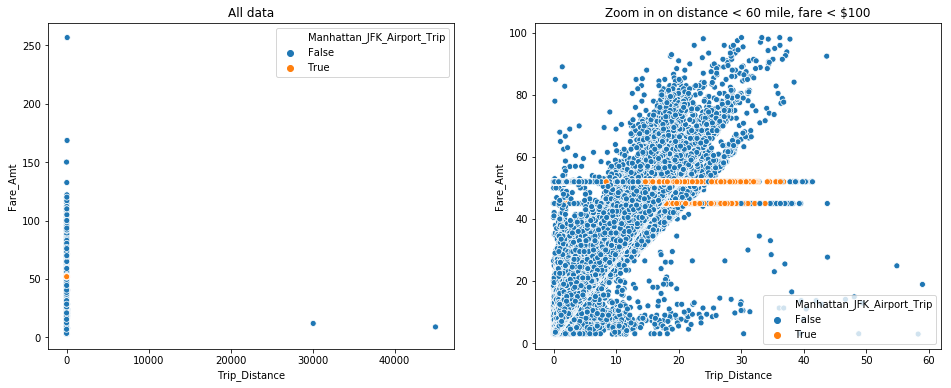

In [54]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### What about the 2 Outlier Cases?
#### 1. Short Distances and High Fare Amount.
#### 2. Long Distances and Low Fare Amount.
#### Idea: Taxi Mileage= Initial Charge + Distance Charge + Time Charge
#### Initial Charge= 2.5 Dollars, Distance Charge= 50 Cents per 1/5 Miles , Time Charge= 50 Cents per 60 seconds in slow traffic or when the vehicle is stopped
#### ->Fares should be at least Formula: 2.5 Dollars+ 2.5 Dollars per Mile, but different Times means differen Fare Structure
#### -> Fares should be not too much higher or lower than Formula: 2.5 Dollars+ 2.5 Dollars per Mile 
#### For more Information go to [Taxi Fare](https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page)
#### Need to find better Solution.....

### Check those 2 Outliers in more Detail

In [55]:
# First create a Column with Duration of Ride
gdf['Trip_Duration'] = (gdf['Dropoff_DateTime']) - (gdf['Pickup_DateTime'])
gdf['Trip_Duration_Seconds'] = gdf['Trip_Duration'].dt.total_seconds()
gdf['Trip_Duration_Minutes'] = gdf['Trip_Duration'].dt.total_seconds()//60

#### Short Distances with High Fare Amount

In [56]:
#2.Short Distances with High Fare Amount ( Fare Amount > 52 & Trip Distance <=9)
gdf.loc[(gdf["Fare_Amt"]>52) & (gdf["Trip_Distance"]<=9)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,,
60163,2009-05-01 19:13:26,2009-05-01 19:19:23,1,1.099609,-73.989014,40.756660,1,65.00000,POINT (-73.989013671875 40.75666046142578),Garment District,100,Manhattan,-73.977516,40.764385,POINT (-73.97751617431641 40.76438522338867),Midtown North,163,Manhattan,False,False,2009,00:05:57,357.0,5.0
63891,2009-12-22 11:08:00,2009-12-22 11:43:00,1,1.610352,-73.981674,40.737186,3,52.68750,POINT (-73.98167419433594 40.73718643188477),Gramercy,107,Manhattan,-74.182541,40.687748,POINT (-74.18254089355469 40.68774795532227),Newark Airport,1,EWR,True,False,2009,00:35:00,2100.0,35.0
90479,2009-11-21 04:39:00,2009-11-21 04:40:00,1,0.219971,-73.997948,40.760757,1,78.00000,POINT (-73.99794769287109 40.76075744628906),Clinton West,50,Manhattan,-74.000381,40.762489,POINT (-74.00038146972656 40.76248931884766),Clinton West,50,Manhattan,False,False,2009,00:01:00,60.0,1.0
160946,2009-07-03 04:56:15,2009-07-03 04:56:52,1,1.000000,-73.969063,40.757359,1,150.00000,POINT (-73.96906280517578 40.75735855102539),Sutton Place/Turtle Bay North,229,Manhattan,-73.970711,40.758369,POINT (-73.97071075439453 40.75836944580078),Midtown East,162,Manhattan,False,False,2009,00:00:37,37.0,0.0
246004,2009-10-30 17:02:00,2009-10-30 17:03:00,1,0.300049,-73.802048,40.675091,1,85.00000,POINT (-73.80204772949219 40.67509078979492),South Ozone Park,216,Queens,-73.801788,40.674549,POINT (-73.80178833007813 40.6745491027832),South Ozone Park,216,Queens,False,False,2009,00:01:00,60.0,1.0
324500,2010-06-14 15:43:00,2010-06-14 16:13:00,1,1.860352,-74.011131,40.724598,3,55.50000,POINT (-74.01113128662109 40.7245979309082),TriBeCa/Civic Center,231,Manhattan,-74.177711,40.690277,POINT (-74.17771148681641 40.69027709960938),Newark Airport,1,EWR,True,False,2010,00:30:00,1800.0,30.0
380293,2010-01-08 01:35:00,2010-01-08 01:36:00,1,0.189941,-73.989716,40.729847,1,53.00000,POINT (-73.98971557617188 40.7298469543457),East Village,79,Manhattan,-73.989944,40.729477,POINT (-73.98994445800781 40.72947692871094),East Village,79,Manhattan,False,False,2010,00:01:00,60.0,1.0
529249,2011-06-17 15:58:00,2011-06-17 17:11:00,1,1.889648,-73.973755,40.755627,3,66.68750,POINT (-73.9737548828125 40.7556266784668),Midtown East,162,Manhattan,-74.176826,40.694172,POINT (-74.17682647705078 40.69417190551758),Newark Airport,1,EWR,True,False,2011,01:13:00,4380.0,73.0
566245,2011-05-18 13:41:00,2011-05-18 14:09:00,2,1.799805,-73.990807,40.696133,3,54.31250,POINT (-73.99080657958984 40.69613265991211),Downtown Brooklyn/MetroTech,65,Brooklyn,-74.177162,40.694881,POINT (-74.17716217041016 40.69488143920898),Newark Airport,1,EWR,True,False,2011,00:28:00,1680.0,28.0


#### Observation:
#### 1. Most of the Rides have the RateCodeID=1
#### 2. Sometimes the Trip_Distance doesn't make sense like the Distance between Gramercy Manhattan to Newark Airport are 1.6 Miles? -> Google Maps says 13,3 Miles
#### 3. That means some Trip_Distances are wrong
#### 4. Sometimes the Trip_Duration is high

In [57]:
#Check how many Percent has RateCodeID=5 and so on
High_Fare_Amt_Short_Distance=gdf.loc[(gdf["Fare_Amt"]>52) & (gdf["Trip_Distance"]<=9)]
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==0])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 0")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==1])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 1")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==2])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 2")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==3])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 3")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==4])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 4")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==5])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 5")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==6])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 6")

0.0 Percent are RateCodeID 0
69.76744186046511 Percent are RateCodeID 1
0.0 Percent are RateCodeID 2
30.23255813953488 Percent are RateCodeID 3
0.0 Percent are RateCodeID 4
0.0 Percent are RateCodeID 5
0.0 Percent are RateCodeID 6


#### Observation:
#### 1. Most Trips have high Trip_Duration
#### 2. Longer Distances doesn't always mean higher Trip_Duration
#### 3. Sometimes even though the Trip_Distance is shorter, it takes longer than a longer Trip_Distance
#### 4. Sometimes a shorter Trip_Distance has more Fare_Amount, because his Trip_Duration is longer -> More Traffic
#### 5. Sometimes a shorter Trip_Distance has more Fare_Amount, because his Trip_Duration is shorter 

In [58]:
#1. Plot on Map to see where does these Trips happen
High_Fare_Amt_Short_Distance=gdf.loc[(gdf["Fare_Amt"]>52) & (gdf["Trip_Distance"]<=11)]

High_Fare_Amt_Short_Distance_Pickup=High_Fare_Amt_Short_Distance[['Pickup_Lat','Pickup_Lon']]
High_Fare_Amt_Short_Distance_Dropoff=High_Fare_Amt_Short_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [59]:
########################Lat,Lon#################################
m_High_Fare_Amt_Short_Distance = folium.Map(location=[40.730610, -73.935242])

for row in High_Fare_Amt_Short_Distance_Pickup.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_High_Fare_Amt_Short_Distance)
    
for row in High_Fare_Amt_Short_Distance_Dropoff.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_High_Fare_Amt_Short_Distance)

In [60]:
m_High_Fare_Amt_Short_Distance

#### Observation:
#### 1.Most of the Short Distances with High Fare Amount are in Area of Lower and Midtown Manhattan
#### 2. But also at the Airports are a high Density of Pickups and Dropoffs
#### 3. There are more Dropoffs than Pickups in Brooklyn
#### 4. There are Dropoffs mostly in Newark Airport

#### Long Distances with small Fare Amount

In [61]:
#1.Long Distances with low Fare Amount ( Fare Amount < 40 & Trip Distance >= 20)
gdf.loc[(gdf["Fare_Amt"]<45) & (gdf["Trip_Distance"]>=20)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,,
13726,2009-02-25 19:14:00,2009-02-25 19:45:00,1,20.265625,-73.789719,40.643047,1,44.500000,POINT (-73.78971862792969 40.64304733276367),JFK Airport,132,Queens,-73.991379,40.683884,POINT (-73.99137878417969 40.68388366699219),Boerum Hill,25,Brooklyn,True,False,2009,00:31:00,1860.0,31.0
14611,2009-06-04 23:00:00,2009-06-04 23:32:00,1,20.187500,-73.788750,40.641495,1,44.093750,POINT (-73.78874969482422 40.64149475097656),JFK Airport,132,Queens,-73.998985,40.680695,POINT (-73.99898529052734 40.68069458007813),Carroll Gardens,40,Brooklyn,True,False,2009,00:32:00,1920.0,32.0
22248,2009-06-28 06:18:00,2009-06-28 06:40:00,1,20.500000,-73.989532,40.688141,1,43.687500,POINT (-73.98953247070313 40.68814086914063),Boerum Hill,25,Brooklyn,-73.776405,40.645309,POINT (-73.77640533447266 40.64530944824219),JFK Airport,132,Queens,True,False,2009,00:22:00,1320.0,22.0
24766,2009-08-09 06:54:00,2009-08-09 07:25:00,2,20.421875,-73.776695,40.645367,1,44.500000,POINT (-73.77669525146484 40.64536666870117),JFK Airport,132,Queens,-73.995544,40.689842,POINT (-73.99554443359375 40.68984222412109),Cobble Hill,52,Brooklyn,True,False,2009,00:31:00,1860.0,31.0
27029,2009-11-19 00:44:16,2009-11-19 01:08:30,1,21.000000,-73.789543,40.646824,1,44.500000,POINT (-73.78954315185547 40.64682388305664),JFK Airport,132,Queens,-73.993744,40.695839,POINT (-73.99374389648438 40.69583892822266),Brooklyn Heights,33,Brooklyn,True,False,2009,00:24:14,1454.0,24.0
38427,2009-08-19 19:42:35,2009-08-19 20:20:36,1,20.500000,-73.789230,40.646721,1,44.500000,POINT (-73.78923034667969 40.64672088623047),JFK Airport,132,Queens,-73.996536,40.680241,POINT (-73.99653625488281 40.68024063110352),Carroll Gardens,40,Brooklyn,True,False,2009,00:38:01,2281.0,38.0
38723,2009-08-02 06:14:00,2009-08-02 06:42:00,5,20.093750,-73.776711,40.645294,1,43.312500,POINT (-73.77671051025391 40.64529418945313),JFK Airport,132,Queens,-73.975281,40.674763,POINT (-73.97528076171875 40.67476272583008),Park Slope,181,Brooklyn,True,False,2009,00:28:00,1680.0,28.0
57614,2009-05-19 20:13:00,2009-05-19 20:44:00,2,20.687500,-73.788841,40.641163,1,44.906250,POINT (-73.78884124755859 40.64116287231445),JFK Airport,132,Queens,-74.022720,40.627674,POINT (-74.02272033691406 40.6276741027832),Bay Ridge,14,Brooklyn,True,False,2009,00:31:00,1860.0,31.0
61552,2009-01-05 02:44:15,2009-01-05 02:58:30,1,30.406250,-73.983620,40.760353,1,3.000000,POINT (-73.98361968994141 40.76035308837891),Times Sq/Theatre District,230,Manhattan,-73.958366,40.768974,POINT (-73.95836639404297 40.76897430419922),Lenox Hill West,141,Manhattan,False,False,2009,00:14:15,855.0,14.0


#### Observation:
#### 1. Most of the Trips have the RateCodeID=1

In [62]:
#Check how many Percent has RateCodeID=5 and so on
Small_Fare_Amt_High_Distance=gdf.loc[(gdf["Fare_Amt"]<45) & (gdf["Trip_Distance"]>=20)]
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==1])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 1")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==2])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 2")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==3])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 3")

99.42196531791907 Percent are RateCodeID 1
0.5780346820809248 Percent are RateCodeID 2
0.0 Percent are RateCodeID 3


In [63]:
#1. Plot on Map to see where does these Trips happen
Small_Fare_Amt_High_Distance=gdf.loc[(gdf["Fare_Amt"]<45) & (gdf["Trip_Distance"]>=20)]

Small_Fare_Amt_High_Distance_Pickup=Small_Fare_Amt_High_Distance[['Pickup_Lat','Pickup_Lon']]
Small_Fare_Amt_High_Distance_Dropoff=Small_Fare_Amt_High_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [64]:
########################Lat,Lon#################################
m_Small_Fare_Amt_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Small_Fare_Amt_High_Distance_Pickup.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Small_Fare_Amt_High_Distance)
    
for row in Small_Fare_Amt_High_Distance_Dropoff.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Small_Fare_Amt_High_Distance)

In [65]:
m_Small_Fare_Amt_High_Distance

#### Observation:
#### 1.Most of the Long Distances with Small Fare Amount are in Area of Lower and Midtown Manhattan
#### 2. But also at the Airports are a high Density of Pickups and Dropoffs
#### 3. There are more Dropoffs than Pickups in Brooklyn

### Are the Trip_Distance really True?
#### Strategy: We use the Haversine distance to compute the line between two Coordinates on Sphere.
#### For more Information go to [Haversine Distance](https://en.wikipedia.org/wiki/Haversine_formula)
#### The end Units will be in km, so in the end we have to convert it back to miles

#### Is Trip_Distance smaller or equals Haversine? -> yes -> Is Fare_Amt smaller or equals computed_harvesine_Fare? ->yes -> Fare_Amt=computed haversine Fare
#### Is Trip_Distance smaller or equals Haversine? -> yes -> Is Fare_Amt bigger than computed_harvesine_Fare? ok
#### Is Trip_Distance smaller or equals Haversine? -> no -> Is Fare_Amt smaller or equals computed normal Fare? -> yes -> Fare_Amt= computed normal Fare
#### Is Trip_Distance smaller or equals Haversine? -> no -> Is Fare_Amt smaller or equals computed normal Fare? -> no -> ok

In [66]:
# Radius of the earth in kilometers
R = 6378
# conversion factor for miles
conv_fac = 0.621371

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    
    
    source: https://stackoverflow.com/a/29546836

    """
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to kilometers
    km = R * c

    # calculate miles
    miles = km * conv_fac
    
    return miles

In [67]:
#compute Haversine Distance
gdf['computed_haversine'] =  haversine(gdf['Pickup_Lon'], gdf['Pickup_Lat'],gdf['Dropoff_Lon'], gdf['Dropoff_Lat']) 
#compute new Fare Amount with Trip_Distance
gdf["Calculated_Fare_Amt_normal"]=0.0
gdf["Calculated_Fare_Amt_normal"]=2.5+2.5*gdf["Trip_Distance"]
#compute new Fare Amount with Haversine Distance
gdf["Calculated_Fare_Amt_haversine"]=0.0
gdf["Calculated_Fare_Amt_haversine"]=2.5+2.5*gdf["computed_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance

In [68]:
print(str(len(gdf.loc[(gdf["Trip_Distance"]<gdf["computed_haversine"])]) / len(gdf)*100) + " "+ "% are lower than Harversine Distance")

5.838028632875844 % are lower than Harversine Distance


In [69]:
gdf.loc[(gdf["Trip_Distance"]<gdf["computed_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine
index,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,1,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan,False,False,2009,00:06:05,365.0,6.0,2.221074,7.998047,8.052684
19,2009-10-11 09:48:46,2009-10-11 09:50:27,1,0.500000,-73.961243,40.811996,1,3.699219,POINT (-73.96124267578125 40.81199645996094),Morningside Heights,166,Manhattan,-73.965897,40.805683,POINT (-73.96589660644531 40.80568313598633),Morningside Heights,166,Manhattan,False,False,2009,00:01:41,101.0,1.0,0.500068,3.750000,3.750170
63,2009-08-29 00:30:00,2009-08-29 00:47:00,1,0.250000,-73.983170,40.734566,1,10.500000,POINT (-73.98316955566406 40.73456573486328),Gramercy,107,Manhattan,-73.988350,40.731548,POINT (-73.98834991455078 40.73154830932617),East Village,79,Manhattan,False,False,2009,00:17:00,1020.0,17.0,0.342545,3.125000,3.356362
72,2009-08-25 21:18:38,2009-08-25 21:22:27,2,0.899902,-73.971359,40.757835,1,4.500000,POINT (-73.97135925292969 40.75783538818359),Midtown East,162,Manhattan,-73.966393,40.770576,POINT (-73.96639251708984 40.77057647705078),Upper East Side South,237,Manhattan,False,False,2009,00:03:49,229.0,3.0,0.918925,4.749756,4.797313
73,2009-01-15 17:18:00,2009-01-15 17:28:00,1,0.140015,-73.987381,40.738297,1,7.300781,POINT (-73.98738098144531 40.73829650878906),Gramercy,107,Manhattan,-73.989120,40.722958,POINT (-73.98912048339844 40.72295761108398),Lower East Side,148,Manhattan,False,False,2009,00:10:00,600.0,10.0,1.064987,2.850037,5.162467
77,2009-05-18 13:15:00,2009-05-18 13:16:00,5,0.449951,-73.946671,40.780548,1,3.300781,POINT (-73.94667053222656 40.78054809570313),Yorkville East,262,Manhattan,-73.942429,40.786354,POINT (-73.94242858886719 40.78635406494141),East Harlem South,75,Manhattan,False,False,2009,00:01:00,60.0,1.0,0.458922,3.624878,3.647306
79,2009-09-14 00:12:00,2009-09-14 00:14:00,1,0.600098,-73.975044,40.752499,1,3.699219,POINT (-73.97504425048828 40.75249862670898),Midtown East,162,Manhattan,-73.980713,40.744759,POINT (-73.980712890625 40.74475860595703),Murray Hill,170,Manhattan,False,False,2009,00:02:00,120.0,2.0,0.612007,4.000244,4.030018
84,2009-02-08 13:57:28,2009-02-08 14:04:14,1,0.600098,-73.963142,40.758457,1,5.699219,POINT (-73.96314239501953 40.75845718383789),Sutton Place/Turtle Bay North,229,Manhattan,-73.973885,40.763237,POINT (-73.97388458251953 40.76323699951172),Midtown North,163,Manhattan,False,False,2009,00:06:46,406.0,6.0,0.652849,4.000244,4.132123
85,2009-11-17 19:46:11,2009-11-17 19:56:31,1,1.400391,-73.963455,40.768742,1,7.300781,POINT (-73.96345520019531 40.76874160766602),Upper East Side South,237,Manhattan,-73.976440,40.750038,POINT (-73.9764404296875 40.75003814697266),Murray Hill,170,Manhattan,False,False,2009,00:10:20,620.0,10.0,1.461512,6.000977,6.153780


#### Decision: change those false Entry to Haversine Value

In [70]:
# Change Trip_Distance to Haversine Distance , if they are smaller
gdf["is_Haversine_Distance"]=False
gdf.loc[(gdf["Trip_Distance"]<gdf["computed_haversine"]),["is_Haversine_Distance"]]=True
gdf.loc[(gdf["Trip_Distance"]<gdf["computed_haversine"]),["Trip_Distance"]]=gdf["computed_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance & Fare Amount is smaller than computed haversine Fare

In [71]:
print(str(len(gdf.loc[(gdf["is_Haversine_Distance"]==True) & (gdf["Fare_Amt"]<gdf["Calculated_Fare_Amt_haversine"])]) / len(gdf)*100) + " "+ "% are lower than Harversine Distance and computed Haversine Fare")

1.7986769867416381 % are lower than Harversine Distance and computed Haversine Fare


In [72]:
gdf.loc[(gdf["is_Haversine_Distance"]==True) & (gdf["Fare_Amt"]<gdf["Calculated_Fare_Amt_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.221074,-73.956551,40.771511,1,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan,False,False,2009,00:06:05,365.0,6.0,2.221074,7.998047,8.052684,True
19,2009-10-11 09:48:46,2009-10-11 09:50:27,1,0.500068,-73.961243,40.811996,1,3.699219,POINT (-73.96124267578125 40.81199645996094),Morningside Heights,166,Manhattan,-73.965897,40.805683,POINT (-73.96589660644531 40.80568313598633),Morningside Heights,166,Manhattan,False,False,2009,00:01:41,101.0,1.0,0.500068,3.750000,3.750170,True
72,2009-08-25 21:18:38,2009-08-25 21:22:27,2,0.918925,-73.971359,40.757835,1,4.500000,POINT (-73.97135925292969 40.75783538818359),Midtown East,162,Manhattan,-73.966393,40.770576,POINT (-73.96639251708984 40.77057647705078),Upper East Side South,237,Manhattan,False,False,2009,00:03:49,229.0,3.0,0.918925,4.749756,4.797313,True
77,2009-05-18 13:15:00,2009-05-18 13:16:00,5,0.458922,-73.946671,40.780548,1,3.300781,POINT (-73.94667053222656 40.78054809570313),Yorkville East,262,Manhattan,-73.942429,40.786354,POINT (-73.94242858886719 40.78635406494141),East Harlem South,75,Manhattan,False,False,2009,00:01:00,60.0,1.0,0.458922,3.624878,3.647306,True
79,2009-09-14 00:12:00,2009-09-14 00:14:00,1,0.612007,-73.975044,40.752499,1,3.699219,POINT (-73.97504425048828 40.75249862670898),Midtown East,162,Manhattan,-73.980713,40.744759,POINT (-73.980712890625 40.74475860595703),Murray Hill,170,Manhattan,False,False,2009,00:02:00,120.0,2.0,0.612007,4.000244,4.030018,True
89,2009-11-17 21:17:50,2009-11-17 21:20:21,1,0.567647,-74.014900,40.704929,1,3.699219,POINT (-74.01490020751953 40.70492935180664),World Trade Center,261,Manhattan,-74.010063,40.712273,POINT (-74.01006317138672 40.71227264404297),TriBeCa/Civic Center,231,Manhattan,False,False,2009,00:02:31,151.0,2.0,0.567647,3.750000,3.919117,True
130,2009-09-09 11:23:14,2009-09-09 11:26:06,1,0.545377,-73.986702,40.761501,1,3.699219,POINT (-73.98670196533203 40.76150131225586),Clinton East,48,Manhattan,-73.981339,40.768257,POINT (-73.98133850097656 40.76825714111328),Central Park,43,Manhattan,False,False,2009,00:02:52,172.0,2.0,0.545377,3.750000,3.863442,True
136,2009-04-22 00:22:15,2009-04-22 00:24:36,1,0.709425,-73.982185,40.731712,1,4.101562,POINT (-73.98218536376953 40.73171234130859),Gramercy,107,Manhattan,-73.976753,40.741108,POINT (-73.97675323486328 40.74110794067383),Kips Bay,137,Manhattan,False,False,2009,00:02:21,141.0,2.0,0.709425,4.250488,4.273562,True
186,2009-04-03 11:50:55,2009-04-03 11:52:41,1,0.475587,-73.975433,40.751804,1,3.300781,POINT (-73.97543334960938 40.75180435180664),Midtown East,162,Manhattan,-73.980034,40.745876,POINT (-73.98003387451172 40.74587631225586),Murray Hill,170,Manhattan,False,False,2009,00:01:46,106.0,1.0,0.475587,3.499756,3.688967,True


#### Decision: change those false Entry to min. Value, because later on we still can get rid of it.

In [73]:
# Change Fare_Amt to computed_normal Fare when Fare_Amt is smaller or equals computed Fare normal
gdf["is_haversine_fare"]=False
gdf.loc[(gdf["is_Haversine_Distance"]==True)&(gdf["Fare_Amt"]<=gdf["Calculated_Fare_Amt_haversine"])  & (gdf["Manhattan_JFK_Airport_Trip"]!=True),["is_haversine_fare"]]=True
gdf.loc[(gdf["is_Haversine_Distance"]==True)&(gdf["Fare_Amt"]<=gdf["Calculated_Fare_Amt_haversine"])  & (gdf["Manhattan_JFK_Airport_Trip"]!=True),["Fare_Amt"]]=gdf["Calculated_Fare_Amt_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance & Fare Amount is bigger than computed haversine Fare

In [74]:
print(str(len(gdf.loc[(gdf["is_Haversine_Distance"]==True) & (gdf["Fare_Amt"]>gdf["Calculated_Fare_Amt_haversine"])]) / len(gdf)*100) + " "+ "% are lower than Harversine Distance and bigger than computed Haversine Fare")

4.0393516461342065 % are lower than Harversine Distance and bigger than computed Haversine Fare


In [75]:
gdf.loc[(gdf["is_Haversine_Distance"]==True) & (gdf["Fare_Amt"]>gdf["Calculated_Fare_Amt_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
63,2009-08-29 00:30:00,2009-08-29 00:47:00,1,0.342545,-73.983170,40.734566,1,10.500000,POINT (-73.98316955566406 40.73456573486328),Gramercy,107,Manhattan,-73.988350,40.731548,POINT (-73.98834991455078 40.73154830932617),East Village,79,Manhattan,False,False,2009,00:17:00,1020.0,17.0,0.342545,3.125000,3.356362,True,False
73,2009-01-15 17:18:00,2009-01-15 17:28:00,1,1.064987,-73.987381,40.738297,1,7.300781,POINT (-73.98738098144531 40.73829650878906),Gramercy,107,Manhattan,-73.989120,40.722958,POINT (-73.98912048339844 40.72295761108398),Lower East Side,148,Manhattan,False,False,2009,00:10:00,600.0,10.0,1.064987,2.850037,5.162467,True,False
84,2009-02-08 13:57:28,2009-02-08 14:04:14,1,0.652849,-73.963142,40.758457,1,5.699219,POINT (-73.96314239501953 40.75845718383789),Sutton Place/Turtle Bay North,229,Manhattan,-73.973885,40.763237,POINT (-73.97388458251953 40.76323699951172),Midtown North,163,Manhattan,False,False,2009,00:06:46,406.0,6.0,0.652849,4.000244,4.132123,True,False
85,2009-11-17 19:46:11,2009-11-17 19:56:31,1,1.461512,-73.963455,40.768742,1,7.300781,POINT (-73.96345520019531 40.76874160766602),Upper East Side South,237,Manhattan,-73.976440,40.750038,POINT (-73.9764404296875 40.75003814697266),Murray Hill,170,Manhattan,False,False,2009,00:10:20,620.0,10.0,1.461512,6.000977,6.153780,True,False
102,2009-05-02 22:14:31,2009-05-02 22:17:26,1,0.178772,-74.003716,40.733471,1,3.699219,POINT (-74.00371551513672 40.73347091674805),West Village,249,Manhattan,-74.004524,40.730961,POINT (-74.00452423095703 40.73096084594727),West Village,249,Manhattan,False,False,2009,00:02:55,175.0,2.0,0.178772,2.749939,2.946929,True,False
158,2009-06-15 22:35:00,2009-06-15 22:42:00,1,0.841683,-73.985367,40.739162,1,5.300781,POINT (-73.98536682128906 40.73916244506836),Gramercy,107,Manhattan,-74.001030,40.741856,POINT (-74.00102996826172 40.74185562133789),East Chelsea,68,Manhattan,False,False,2009,00:07:00,420.0,7.0,0.841683,2.749939,4.604208,True,False
159,2009-10-07 08:22:00,2009-10-07 08:31:00,1,1.714627,-73.983139,40.769138,1,7.300781,POINT (-73.98313903808594 40.76913833618164),Lincoln Square East,142,Manhattan,-73.965569,40.790054,POINT (-73.96556854248047 40.79005432128906),Central Park,43,Manhattan,False,False,2009,00:09:00,540.0,9.0,1.714627,6.450195,6.786569,True,False
185,2009-03-06 13:42:11,2009-03-06 13:46:29,1,0.500051,-73.970924,40.755543,1,4.500000,POINT (-73.97092437744141 40.75554275512695),Sutton Place/Turtle Bay North,229,Manhattan,-73.966606,40.761993,POINT (-73.96660614013672 40.76199340820313),Upper East Side South,237,Manhattan,False,False,2009,00:04:18,258.0,4.0,0.500051,3.499756,3.750127,True,False
216,2009-01-09 15:31:15,2009-01-09 15:34:14,1,0.632932,-73.987068,40.733448,1,4.101562,POINT (-73.98706817626953 40.73344802856445),Gramercy,107,Manhattan,-73.981361,40.741512,POINT (-73.98136138916016 40.74151229858398),Gramercy,107,Manhattan,False,False,2009,00:02:59,179.0,2.0,0.632932,4.000244,4.082331,True,False


### Check how many Rows the Trip_Distance is bigger than the Haversine Distance & Fare Amount is smaller than computed normal Fare

In [76]:
print(str(len(gdf.loc[(gdf["is_Haversine_Distance"]==False) & (gdf["Fare_Amt"]<gdf["Calculated_Fare_Amt_normal"])]) / len(gdf)*100) + " "+ "% are bigger than Harversine Distance and smaller than computed Normal Fare")

16.18574043889245 % are bigger than Harversine Distance and smaller than computed Normal Fare


In [77]:
gdf.loc[(gdf["is_Haversine_Distance"]==False) & (gdf["Fare_Amt"]<gdf["Calculated_Fare_Amt_normal"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,1,9.000000,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan,False,False,2009,00:06:25,385.0,6.0,1.860050,9.501953,7.150124,False,False
13,2009-04-09 01:00:00,2009-04-09 01:08:00,1,3.070312,-73.977264,40.751785,1,8.898438,POINT (-73.97726440429688 40.75178527832031),Murray Hill,170,Manhattan,-73.970482,40.786671,POINT (-73.97048187255859 40.78667068481445),Upper West Side North,238,Manhattan,False,False,2009,00:08:00,480.0,8.0,2.438998,10.175781,8.597496,False,False
15,2009-11-26 01:33:00,2009-11-26 01:40:00,3,2.169922,-73.937485,40.804089,1,6.898438,POINT (-73.93748474121094 40.8040885925293),East Harlem North,74,Manhattan,-73.951912,40.777992,POINT (-73.95191192626953 40.77799224853516),Yorkville West,263,Manhattan,False,False,2009,00:07:00,420.0,7.0,1.957016,7.924805,7.392541,False,False
18,2009-01-09 12:33:00,2009-01-09 12:56:00,5,8.187500,-73.954681,40.789333,1,22.093750,POINT (-73.95468139648438 40.78933334350586),East Harlem South,75,Manhattan,-74.007004,40.705563,POINT (-74.00700378417969 40.70556259155273),Financial District North,87,Manhattan,False,False,2009,00:23:00,1380.0,23.0,6.410489,22.968750,18.526222,False,False
32,2009-04-11 03:13:00,2009-04-11 03:28:00,1,3.759766,-73.984550,40.759907,1,11.703125,POINT (-73.98455047607422 40.75990676879883),Times Sq/Theatre District,230,Manhattan,-73.956078,40.803062,POINT (-73.95607757568359 40.80306243896484),Central Harlem,41,Manhattan,False,False,2009,00:15:00,900.0,15.0,3.336770,11.899414,10.841925,False,False
36,2009-05-17 11:55:09,2009-05-17 12:15:46,1,10.296875,-73.985596,40.763168,1,24.906250,POINT (-73.985595703125 40.76316833496094),Clinton East,48,Manhattan,-73.861465,40.768147,POINT (-73.86146545410156 40.76814651489258),LaGuardia Airport,138,Queens,True,False,2009,00:20:37,1237.0,20.0,6.511755,28.242188,18.779388,False,False
38,2009-08-16 19:02:00,2009-08-16 19:20:00,5,8.453125,-73.872940,40.774055,1,20.906250,POINT (-73.87294006347656 40.77405548095703),LaGuardia Airport,138,Queens,-73.959290,40.776997,POINT (-73.95928955078125 40.77699661254883),Upper East Side North,236,Manhattan,True,False,2009,00:18:00,1080.0,18.0,4.527455,23.632812,13.818638,False,False
39,2009-02-08 13:33:19,2009-02-08 13:36:00,1,0.600098,-73.945190,40.774334,1,3.699219,POINT (-73.9451904296875 40.77433395385742),Yorkville East,262,Manhattan,-73.954208,40.778378,POINT (-73.95420837402344 40.77837753295898),Yorkville West,263,Manhattan,False,False,2009,00:02:41,161.0,2.0,0.548852,4.000244,3.872129,False,False
42,2009-01-04 00:43:00,2009-01-04 00:53:00,3,5.371094,-73.981941,40.768929,1,15.296875,POINT (-73.98194122314453 40.76892852783203),Lincoln Square East,142,Manhattan,-73.939934,40.726067,POINT (-73.93993377685547 40.72606658935547),Greenpoint,112,Brooklyn,False,False,2009,00:10:00,600.0,10.0,3.692587,15.927734,11.731468,False,False


#### Decision: change those false Entry to min. Value, because later on we still can get rid of it.

In [78]:
# Change Fare_Amt to computed_normal Fare when Fare_Amt is smaller or equals computed Fare normal
gdf["is_normal_fare"]=False
gdf.loc[(gdf["is_Haversine_Distance"]==False) &(gdf["Fare_Amt"]<=gdf["Calculated_Fare_Amt_normal"])  & (gdf["Manhattan_JFK_Airport_Trip"]!=True),["is_normal_fare"]]=True
gdf.loc[(gdf["is_Haversine_Distance"]==False) &(gdf["Fare_Amt"]<=gdf["Calculated_Fare_Amt_normal"])  & (gdf["Manhattan_JFK_Airport_Trip"]!=True),["Fare_Amt"]]=gdf["Calculated_Fare_Amt_normal"]

### Check how many Rows the Trip_Distance is bigger than the Haversine Distance & Fare Amount is bigger than computed normal Fare

In [79]:
print(str(len(gdf.loc[(gdf["is_Haversine_Distance"]==False) & (gdf["Fare_Amt"]>gdf["Calculated_Fare_Amt_normal"])]) / len(gdf)*100) + " "+ "% are bigger than Harversine Distance and bigger than computed Normal Fare")

77.83738458659234 % are bigger than Harversine Distance and bigger than computed Normal Fare


In [80]:
gdf.loc[(gdf["is_Haversine_Distance"]==False) & (gdf["Fare_Amt"]>gdf["Calculated_Fare_Amt_normal"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,1,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan,False,False,2009,00:09:00,540.0,9.0,1.862852,7.749023,7.157130,False,False,False
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,1,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan,False,False,2009,00:28:00,1680.0,28.0,2.496187,12.695312,8.740468,False,False,False
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,1,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan,False,False,2009,00:08:00,480.0,8.0,0.712135,4.499512,4.280337,False,False,False
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,1,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan,False,False,2009,00:12:02,722.0,12.0,0.889383,5.749512,4.723458,False,False,False
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,1,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan,False,False,2009,00:17:00,1020.0,17.0,2.411086,8.974609,8.527715,False,False,False
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,1,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan,False,False,2009,00:10:00,600.0,10.0,2.242142,8.422852,8.105356,False,False,False
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,1,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan,False,False,2009,00:20:08,1208.0,20.0,3.757682,13.496094,11.894205,False,False,False
9,2009-03-18 09:21:59,2009-03-18 09:39:36,1,3.000000,-73.959396,40.777058,1,11.703125,POINT (-73.95939636230469 40.77705764770508),Upper East Side North,236,Manhattan,-73.984779,40.742172,POINT (-73.98477935791016 40.74217224121094),Gramercy,107,Manhattan,False,False,2009,00:17:37,1057.0,17.0,2.755137,10.000000,9.387843,False,False,False
10,2009-05-12 19:06:29,2009-05-12 19:12:06,4,1.000000,-74.000648,40.727222,1,5.300781,POINT (-74.00064849853516 40.72722244262695),SoHo,211,Manhattan,-73.985931,40.729492,POINT (-73.98593139648438 40.7294921875),East Village,79,Manhattan,False,False,2009,00:05:37,337.0,5.0,0.786963,5.000000,4.467408,False,False,False


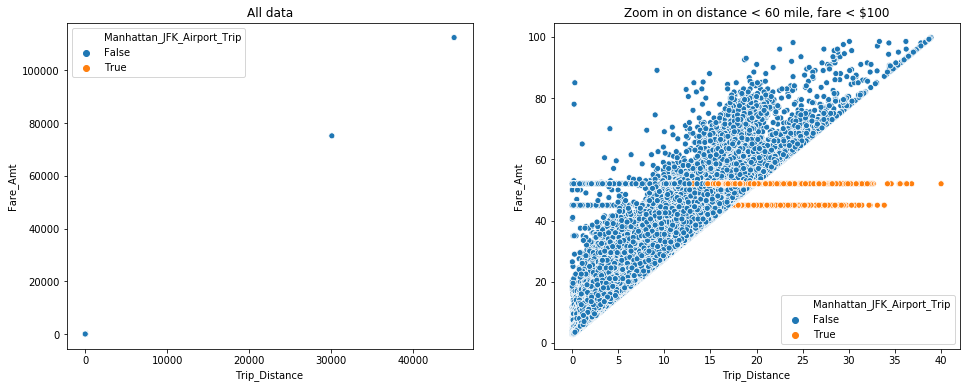

In [81]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

#### There are still Outliers

In [82]:
# How many Data is left?
origin_length=2000000
print(str(len(gdf)/origin_length *100) + " "+ " % is left of the origin")

95.6453  % is left of the origin


### 2. Speed of Ride

In [83]:

#extract Month from Datetime Object
gdf["Pickup_Month"]=gdf["Pickup_DateTime"].dt.month
#extract Day from Datetime Object
gdf["Pickup_Day"]=gdf["Pickup_DateTime"].dt.day
#extract Day of Week from Datetime Object
gdf["Pickup_Weekday"]=gdf["Pickup_DateTime"].dt.day_name()
gdf["Pickup_Weekday_Int"]=gdf["Pickup_DateTime"].dt.dayofweek
#extract Hour from Datetime Object
gdf["Pickup_Hour"]=gdf["Pickup_DateTime"].dt.hour

In [84]:
# Create Column Speed
gdf["Speed"]=0.0
# Conversion factor to convert miles to km
conversion_factor = 1.609
# Get Speed in km/h
gdf["Speed"]=(((gdf["Trip_Distance"]*conversion_factor)/gdf["Trip_Duration_Seconds"])*3600)
# Floor Values of Speed because we don't need the fraction
gdf["Speed"]=gdf["Speed"].apply(np.floor)

In [85]:
gdf

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,1,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan,False,False,2009,00:09:00,540.0,9.0,1.862852,7.749023,7.157130,False,False,False,6,4,Thursday,3,22,22.0
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,1,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan,False,False,2009,00:28:00,1680.0,28.0,2.496187,12.695312,8.740468,False,False,False,6,6,Saturday,5,22,14.0
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,1,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan,False,False,2009,00:08:00,480.0,8.0,0.712135,4.499512,4.280337,False,False,False,6,19,Friday,4,17,9.0
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.221074,-73.956551,40.771511,1,8.052684,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan,False,False,2009,00:06:05,365.0,6.0,2.221074,7.998047,8.052684,True,True,False,1,18,Sunday,6,19,35.0
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,1,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan,False,False,2009,00:12:02,722.0,12.0,0.889383,5.749512,4.723458,False,False,False,7,13,Monday,0,9,10.0
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,1,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan,False,False,2009,00:17:00,1020.0,17.0,2.411086,8.974609,8.527715,False,False,False,9,15,Tuesday,1,18,14.0
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,1,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan,False,False,2009,00:10:00,600.0,10.0,2.242142,8.422852,8.105356,False,False,False,5,2,Saturday,5,20,22.0
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,1,9.501953,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan,False,False,2009,00:06:25,385.0,6.0,1.860050,9.501953,7.150124,False,False,True,2,14,Saturday,5,5,42.0
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,1,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan,False,False,2009,00:20:08,1208.0,20.0,3.757682,13.496094,11.894205,False,False,False,7,24,Friday,4,22,21.0


In [86]:
gdf["Speed"].describe()

count    1.912906e+06
mean     2.085789e+01
std      3.568545e+02
min      0.000000e+00
25%      1.300000e+01
50%      1.800000e+01
75%      2.400000e+01
max      4.516660e+05
Name: Speed, dtype: float64

#### Observation:
#### 1. max. Speed is 451666 km/h 
#### 2. min. Speed is 0 km/h

### In residential neighborhood areas outside of New York City range between 30–40 mph and 35–45 mph on suburban/urban arterial routes.
#### For more Information go to [New York](https://en.m.wikipedia.org/wiki/Speed_limits_in_the_United_States_by_jurisdiction)

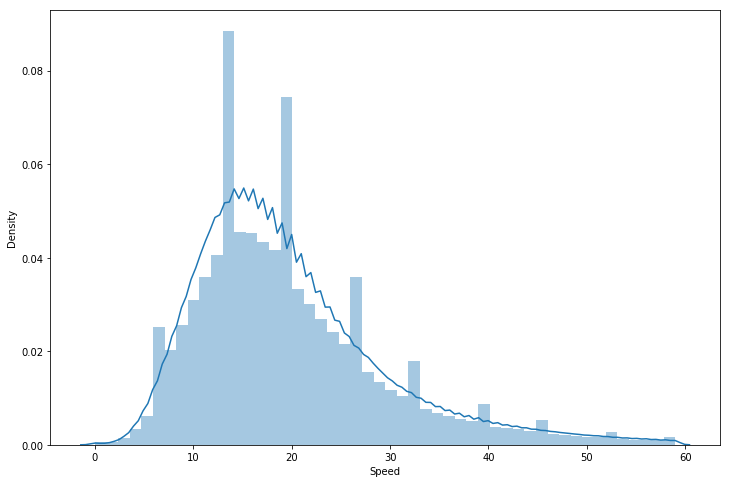

In [87]:
# Create Dataframe for Speed under 60 km/h
df_speed_under_60_kmh=gdf.loc[gdf["Speed"]<60]["Speed"]
# Plot Distribution of Speed
plt.figure(figsize = (12, 8))
plt.xlabel('Speed in km/h') 
plt.ylabel('Density')
sns.distplot(df_speed_under_60_kmh);

### How does the Speed vary during the day?

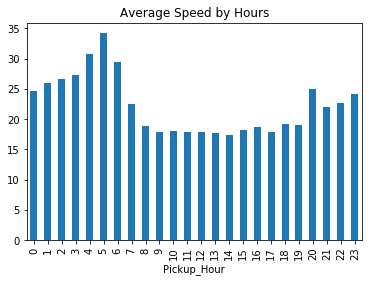

In [88]:
# Plot Average Speed during the Day
plt.title('Average Speed by Hours')
gdf.groupby("Pickup_Hour")["Speed"].agg("mean").plot.bar()

#### Observation:
#### 1. The average speed is lower during the day, because of busy traffic

### How does the Speed vary during Weekdays?

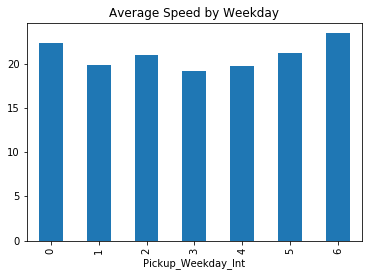

In [89]:
# Plot Average Speed during the Week
plt.title('Average Speed by Weekday')
gdf.groupby("Pickup_Weekday_Int")["Speed"].agg("mean").plot.bar()

#### Observation:
#### 1.Our taxis appear to be travelling faster on the weekend and on a Monday than during the rest of the week.

In [90]:
print(str(len(gdf.loc[gdf["Speed"]>70])/len(gdf)*100))

0.2592913608927987


In [91]:
print(str(len(gdf.loc[gdf["Speed"]==0])/len(gdf)*100))

0.03884142764986884


#### Decision: Remove Datapoints with 0 Speed and and Speed above 70 km/h

In [92]:
indexNames = gdf.loc[(gdf['Speed'] == 0) | (gdf['Speed'] > 70)].index
gdf.drop(indexNames , inplace=True)

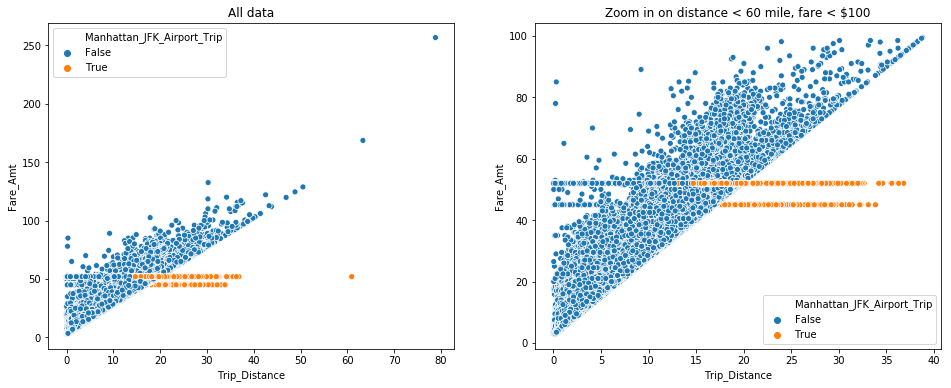

In [93]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### What about the Pickup and Dropoff Boroughs?

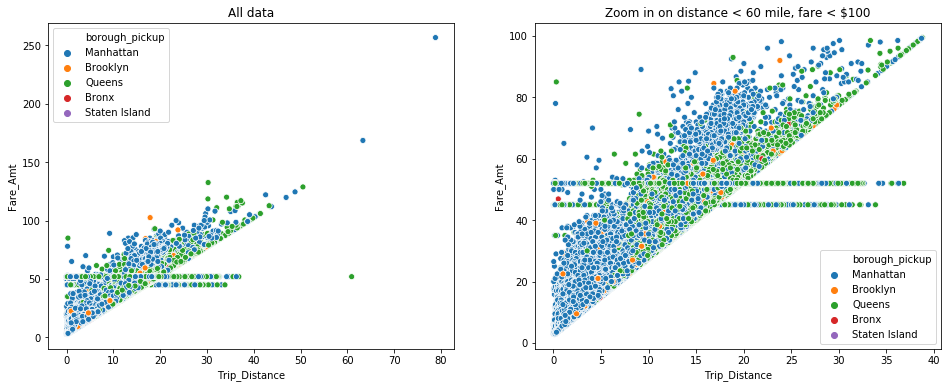

In [94]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="borough_pickup")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="borough_pickup")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

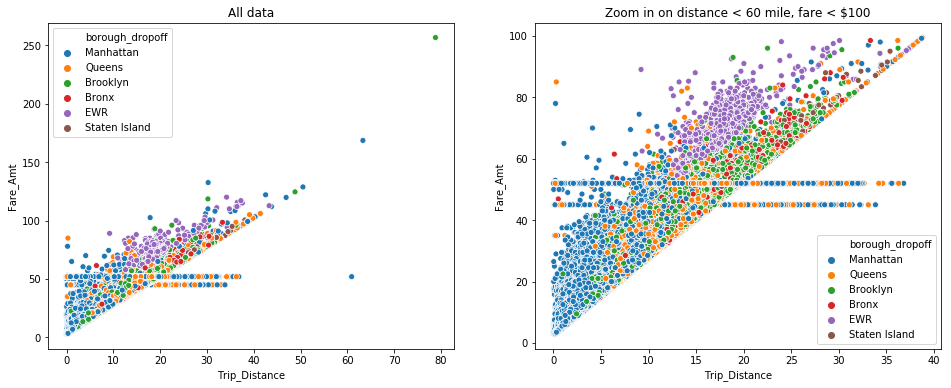

In [95]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="borough_dropoff")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="borough_dropoff")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### What about the Outliers?

In [96]:
gdf.loc[gdf["Fare_Amt"]>150]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1457326,2014-12-14 09:44:54,2014-12-14 11:26:15,1,63.3125,-73.944183,40.792255,1,168.5,POINT (-73.94418334960938 40.79225540161133),East Harlem South,75,Manhattan,-73.977242,40.744434,POINT (-73.97724151611328 40.74443435668945),Kips Bay,137,Manhattan,False,False,2014,01:41:21,6081.0,101.0,3.733691,160.78125,11.834229,False,False,False,12,14,Sunday,6,9,60.0
1503118,2015-05-28 16:43:39,2015-05-28 21:28:55,1,78.8125,-73.977509,40.746696,1,256.5,POINT (-73.97750854492188 40.74669647216797),Murray Hill,170,Manhattan,-73.951584,40.718895,POINT (-73.95158386230469 40.71889495849609),Williamsburg (North Side),255,Brooklyn,False,False,2015,04:45:16,17116.0,285.0,2.354558,199.53125,8.386395,False,False,False,5,28,Thursday,3,16,26.0


#### Observation:
#### 1. Trip_Distance is too high for Trip and Fare Amount is false

In [97]:
indexNames = gdf.loc[gdf["Fare_Amt"]>150].index
gdf.drop(indexNames , inplace=True)

In [98]:
gdf.loc[gdf["Trip_Distance"]>=60]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1905642,2016-02-07 07:42:46,2016-02-07 09:45:15,1,60.90625,-73.784904,40.64584,2,52.0,POINT (-73.78490447998047 40.64583969116211),JFK Airport,132,Queens,-73.976936,40.747807,POINT (-73.97693634033203 40.74780654907227),Murray Hill,170,Manhattan,True,True,2016,02:02:29,7349.0,122.0,12.294871,154.765625,33.237179,False,False,False,2,7,Sunday,6,7,48.0


#### Observation:
#### 1. Trip_Distance is at fault 

In [99]:
indexNames = gdf.loc[gdf["Trip_Distance"]>=60].index
gdf.drop(indexNames , inplace=True)

### What about the 2 Horizontal Line?

In [100]:
gdf.loc[((gdf["Fare_Amt"]==45) | (gdf["Fare_Amt"]==52)) & (gdf["RateCodeID"]==1)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2370,2009-01-30 10:12:33,2009-01-30 10:29:13,1,7.300781,-73.934975,40.746342,1,45.0,POINT (-73.93497467041016 40.74634170532227),Sunnyside,226,Queens,-73.862389,40.767223,POINT (-73.86238861083984 40.7672233581543),LaGuardia Airport,138,Queens,True,False,2009,00:16:40,1000.0,16.0,4.068132,20.751953,12.670331,False,False,False,1,30,Friday,4,10,42.0
3063,2009-05-12 19:53:00,2009-05-12 19:54:00,5,0.691409,-73.788910,40.641514,1,45.0,POINT (-73.78890991210938 40.64151382446289),JFK Airport,132,Queens,-73.776772,40.645401,POINT (-73.77677154541016 40.64540100097656),JFK Airport,132,Queens,True,False,2009,00:01:00,60.0,1.0,0.691409,2.550011,4.228523,True,False,False,5,12,Tuesday,1,19,66.0
3356,2009-03-31 22:05:34,2009-03-31 22:32:54,2,13.398438,-73.987923,40.753227,1,45.0,POINT (-73.98792266845703 40.75322723388672),Garment District,100,Manhattan,-73.806862,40.665966,POINT (-73.80686187744141 40.66596603393555),South Ozone Park,216,Queens,False,False,2009,00:27:20,1640.0,27.0,11.249616,35.996094,30.624039,False,False,False,3,31,Tuesday,1,22,47.0
3441,2009-08-10 10:04:59,2009-08-10 10:20:17,1,3.400391,-73.949921,40.741703,1,45.0,POINT (-73.94992065429688 40.74170303344727),Long Island City/Hunters Point,145,Queens,-74.003098,40.747440,POINT (-74.00309753417969 40.74744033813477),East Chelsea,68,Manhattan,False,False,2009,00:15:18,918.0,15.0,2.814975,11.000977,9.537436,False,False,False,8,10,Monday,0,10,21.0
4033,2009-02-23 20:53:00,2009-02-23 21:02:00,1,0.990234,-73.984795,40.724174,1,45.0,POINT (-73.98479461669922 40.72417449951172),East Village,79,Manhattan,-73.983459,40.724487,POINT (-73.98345947265625 40.7244873046875),East Village,79,Manhattan,False,False,2009,00:09:00,540.0,9.0,0.073122,4.975586,2.682805,False,False,False,2,23,Monday,0,20,10.0
5639,2009-08-15 07:11:00,2009-08-15 07:26:00,2,4.050781,-73.930237,40.736912,1,45.0,POINT (-73.93023681640625 40.73691177368164),Sunnyside,226,Queens,-73.988022,40.759403,POINT (-73.98802185058594 40.75940322875977),Times Sq/Theatre District,230,Manhattan,False,False,2009,00:15:00,900.0,15.0,3.404547,12.626953,11.011368,False,False,False,8,15,Saturday,5,7,26.0
5994,2009-08-21 22:13:00,2009-08-21 22:36:00,1,7.589844,-73.989517,40.756508,1,45.0,POINT (-73.98951721191406 40.75650787353516),Garment District,100,Manhattan,-73.886848,40.738384,POINT (-73.88684844970703 40.73838424682617),Elmhurst/Maspeth,83,Queens,False,False,2009,00:23:00,1380.0,23.0,5.524325,21.474609,16.310814,False,False,False,8,21,Friday,4,22,31.0
6130,2009-04-23 18:28:25,2009-04-23 18:50:42,1,5.898438,-73.891502,40.725685,1,45.0,POINT (-73.89150238037109 40.72568511962891),Maspeth,157,Queens,-73.990753,40.750332,POINT (-73.99075317382813 40.75033187866211),Penn Station/Madison Sq West,186,Manhattan,False,False,2009,00:22:17,1337.0,22.0,5.473870,17.246094,16.184675,False,False,False,4,23,Thursday,3,18,25.0
6610,2009-05-16 13:24:10,2009-05-16 13:48:05,1,4.500000,-73.933098,40.725456,1,45.0,POINT (-73.93309783935547 40.72545623779297),East Williamsburg,80,Brooklyn,-74.004158,40.721664,POINT (-74.00415802001953 40.72166442871094),SoHo,211,Manhattan,False,False,2009,00:23:55,1435.0,23.0,3.734337,13.750000,11.835843,False,False,False,5,16,Saturday,5,13,18.0


#### Observation:
#### They are strange

In [101]:
invalid_horizontal_line=gdf.loc[((gdf["Fare_Amt"]==45) | (gdf["Fare_Amt"]==52)) & (gdf["RateCodeID"]==1)]
print(str(len(invalid_horizontal_line) /len(gdf)*100) +" "+ "% are invalid")

0.043781459731543626 % are invalid


In [102]:
indexNames = gdf.loc[((gdf["Fare_Amt"]==45) | (gdf["Fare_Amt"]==52)) & (gdf["RateCodeID"]==1)].index
gdf.drop(indexNames , inplace=True)

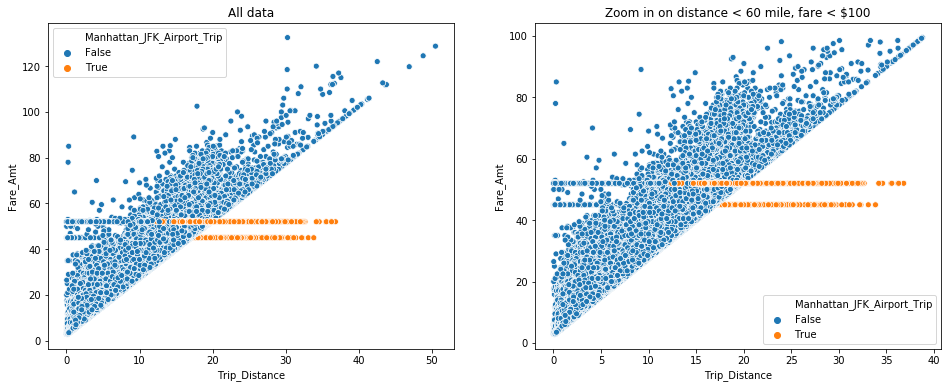

In [103]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### 3. Does the Number of Passengers affect the Fare?

Text(0.5, 1.0, 'All data')

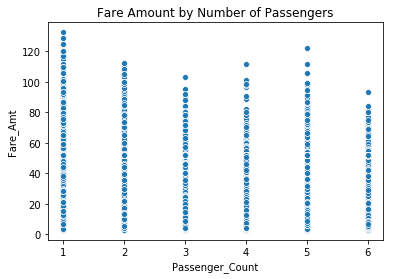

In [104]:
# scatter plot passenger count - fare
plt.title('Fare Amount by Number of Passengers')
sns.scatterplot(data=gdf,x="Passenger_Count", y="Fare_Amt")
axs[0].set_xlabel('Passenger_Count')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

#### Observation:
#### 1. The most highest Fares are on 1 Passenger
#### 2. But have not real Correlation with Fares

### How many Fare Entries with Passenger Count?

In [105]:
print(str(len(gdf.loc[gdf["Passenger_Count"]==1])/len(gdf)*100) + " " + "% have 1 Passengers")
print(str(len(gdf.loc[gdf["Passenger_Count"]==2])/len(gdf)*100) + " " + "% have 2 Passengers")
print(str(len(gdf.loc[gdf["Passenger_Count"]==3])/len(gdf)*100) + " " + "% have 3 Passengers")
print(str(len(gdf.loc[gdf["Passenger_Count"]==4])/len(gdf)*100) + " " + "% have 4 Passengers")
print(str(len(gdf.loc[gdf["Passenger_Count"]==5])/len(gdf)*100) + " " + "% have 5 Passengers")
print(str(len(gdf.loc[gdf["Passenger_Count"]==6])/len(gdf)*100) + " " + "% have 6 Passengers")

69.6356154251678 % have 1 Passengers
14.767109131776968 % have 2 Passengers
4.360392684506902 % have 3 Passengers
2.113761005893415 % have 4 Passengers
6.739947491692304 % have 5 Passengers
2.383174260962617 % have 6 Passengers


### Which Passenger Count has the highest and lowest Fare Amount?

In [106]:
gdf.groupby('Passenger_Count')['Fare_Amt'].agg(['min', 'max'])

,min,max
Passenger_Count,,
1,2.900391,132.500000
2,2.900391,112.500000
3,2.900391,103.515625
4,2.900391,112.000000
5,2.900391,122.000000
6,2.900391,93.671875


#### Observation
#### 1. Passenger 1 contains the highest Fare Amount and Passenger 6 contains the lowest Fare Amount 

### What is the Average Fare Amount for Passenger Count?

In [107]:
gdf.groupby('Passenger_Count')['Fare_Amt'].agg(['mean', 'count'])

,mean,count
Passenger_Count,,
1,11.323004,1327509
2,11.922882,281515
3,11.736391,83125
4,11.898698,40296
5,11.512734,128488
6,12.215735,45432


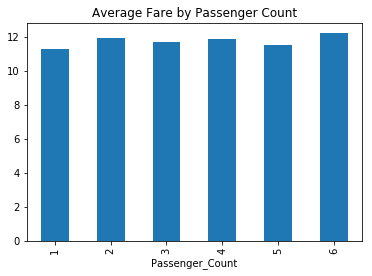

In [108]:
plt.title('Average Fare by Passenger Count')
df_avg_fare_pass=gdf.groupby('Passenger_Count')['Fare_Amt'].mean().plot.bar()

#### Observation
#### 1. 6 Passengers have the highest Average Fare Amount
#### 2. 1 Passenger has the lowest Average Fare Amount

### What about the Distribution of Fare Amount by Number of Passengers?

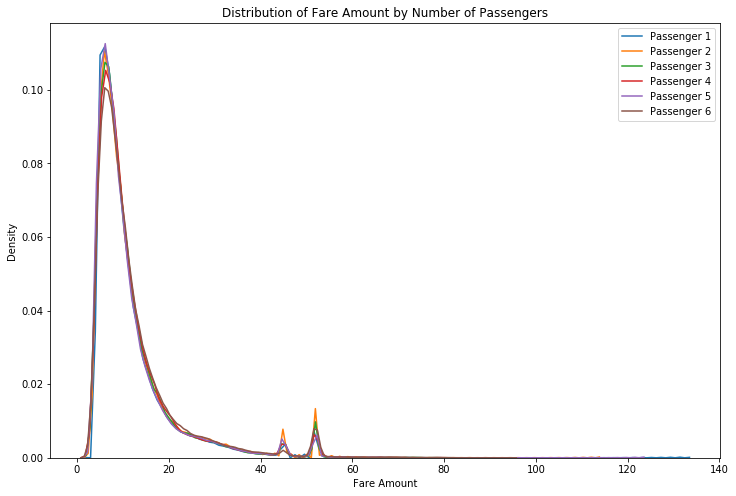

In [109]:
# Dataframe with sorted Passenger Count and Fare Amount
df_pass_fare=gdf[["Passenger_Count","Fare_Amt"]]
df_pass_fare=df_pass_fare.loc[df_pass_fare["Fare_Amt"]<200]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount by Number of Passengers")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==1,"Fare_Amt"], label="Passenger 1")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==2,"Fare_Amt"], label="Passenger 2")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==3,"Fare_Amt"], label="Passenger 3")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==4,"Fare_Amt"], label="Passenger 4")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==5,"Fare_Amt"], label="Passenger 5")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==6,"Fare_Amt"], label="Passenger 6")

#### Observation:
#### 1. The Difference between the Passenger Numbers are not too much or you can say pretty much the same

### 4. How is the Relation between Trip_Duration and Trip_Distance?

#### For Reference a Trip from Tottenville Staten Island to Bay Terrace -> approximately has 49.2 Miles and cost around 131.20 Dollars with 74 minutes Trip Duration
#### For more Information go to [Taxi Fare](https://www.taxifarefinder.com/main.php?city=NY&from=Tottenville%2C+Staten+Island%2C+New+York%2C+New+York+10307%2C+United+States&to=Bay+Terrace%2C+Queens%2C+Bay+Terrace%2C+New+York+11360%2C+United+States&fromCoord=40.5112,-74.2493&toCoord=40.79,-73.79)

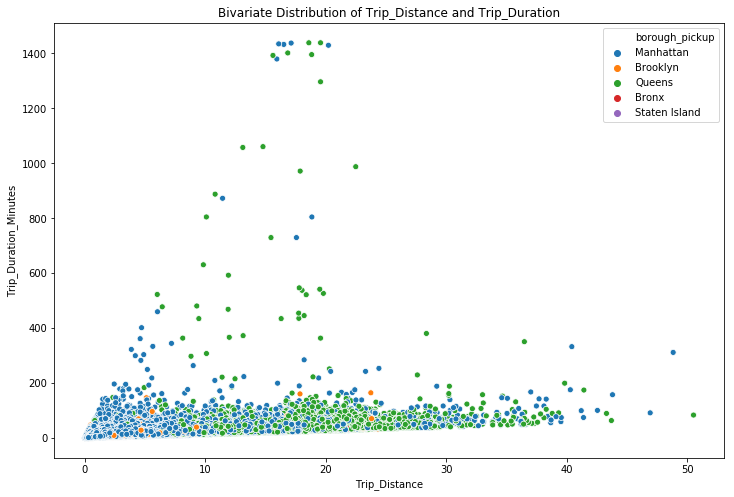

In [110]:
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Trip_Duration')
plt.title('Bivariate Distribution of Trip_Distance and Trip_Duration')
sns.scatterplot(data=gdf,x="Trip_Distance", y="Trip_Duration_Minutes",hue="borough_pickup")

#### Observation:
#### 1. There are some Trip Distances until 20 Miles which have very high Trip Duration
#### 2. Does it make sense?

In [111]:
gdf.loc[gdf["Trip_Duration_Minutes"]>180]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2848,2009-04-21 22:01:33,2009-04-22 03:36:10,1,5.651361,-73.969719,40.797306,1,16.628403,POINT (-73.96971893310547 40.79730606079102),Manhattan Valley,151,Manhattan,-73.877686,40.840015,POINT (-73.877685546875 40.84001541137695),East Tremont,78,Bronx,False,False,2009,05:34:37,20077.0,334.0,5.651361,8.251953,16.628403,True,True,False,4,21,Tuesday,1,22,1.0
6652,2009-05-01 22:45:56,2009-05-02 03:00:17,1,24.406250,-73.963898,40.767052,1,66.500000,POINT (-73.96389770507813 40.76705169677734),Upper East Side South,237,Manhattan,-73.761795,40.687603,POINT (-73.76179504394531 40.68760299682617),Saint Albans,205,Queens,False,False,2009,04:14:21,15261.0,254.0,11.934465,63.515625,32.336163,False,False,False,5,1,Friday,4,22,9.0
53619,2009-07-10 08:29:00,2009-07-10 12:41:00,1,20.296875,-73.793388,40.656582,2,45.000000,POINT (-73.79338836669922 40.65658187866211),JFK Airport,132,Queens,-73.980942,40.763252,POINT (-73.98094177246094 40.76325225830078),Times Sq/Theatre District,230,Manhattan,True,True,2009,04:12:00,15120.0,252.0,12.293849,53.242188,33.234623,False,False,False,7,10,Friday,4,8,7.0
63265,2009-02-21 23:35:20,2009-02-22 04:47:44,1,48.812500,-73.994202,40.751232,1,124.531250,POINT (-73.99420166015625 40.7512321472168),East Chelsea,68,Manhattan,-73.941185,40.669334,POINT (-73.94118499755859 40.66933441162109),Crown Heights North,61,Brooklyn,False,False,2009,05:12:24,18744.0,312.0,6.310028,124.531250,18.275070,False,False,True,2,21,Saturday,5,23,15.0
109575,2009-04-27 06:28:57,2009-04-27 11:33:31,1,4.898438,-73.954498,40.786663,1,14.746094,POINT (-73.95449829101563 40.78666305541992),Upper East Side North,236,Manhattan,-74.000748,40.762012,POINT (-74.00074768066406 40.76201248168945),Clinton West,50,Manhattan,False,False,2009,05:04:34,18274.0,304.0,2.962642,14.746094,9.906607,False,False,True,4,27,Monday,0,6,1.0
124794,2009-01-31 17:21:08,2009-02-01 01:19:54,1,6.434403,-73.872971,40.774231,1,18.586008,POINT (-73.87297058105469 40.77423095703125),LaGuardia Airport,138,Queens,-73.989136,40.744053,POINT (-73.9891357421875 40.74405288696289),Union Sq,234,Manhattan,True,False,2009,07:58:46,28726.0,478.0,6.434403,15.751953,18.586008,True,True,False,1,31,Saturday,5,17,1.0
143396,2009-02-05 23:32:19,2009-02-06 03:02:43,1,10.796875,-73.988922,40.758202,1,29.492188,POINT (-73.98892211914063 40.75820159912109),Times Sq/Theatre District,230,Manhattan,-73.994308,40.763134,POINT (-73.99430847167969 40.76313400268555),Clinton West,50,Manhattan,False,False,2009,03:30:24,12624.0,210.0,0.442793,29.492188,3.606983,False,False,True,2,5,Thursday,3,23,4.0
164713,2009-09-03 17:18:37,2009-09-03 20:25:14,1,12.203125,-73.862885,40.769646,1,33.007812,POINT (-73.86288452148438 40.76964569091797),LaGuardia Airport,138,Queens,-73.981987,40.756611,POINT (-73.98198699951172 40.75661087036133),Midtown Center,161,Manhattan,True,False,2009,03:06:37,11197.0,186.0,6.304688,33.007812,18.261719,False,False,True,9,3,Thursday,3,17,6.0
210273,2009-05-21 06:49:18,2009-05-21 11:34:25,1,18.203125,-73.979935,40.743134,1,48.007812,POINT (-73.97993469238281 40.74313354492188),Kips Bay,137,Manhattan,-73.885521,40.773232,POINT (-73.88552093505859 40.77323150634766),LaGuardia Airport,138,Queens,True,False,2009,04:45:07,17107.0,285.0,5.366898,48.007812,15.917245,False,False,True,5,21,Thursday,3,6,6.0


#### Drop Rows with Trip Duration greater than 2 and half Hours

In [112]:
indexNames = gdf.loc[gdf["Trip_Duration_Minutes"]>150].index
gdf.drop(indexNames , inplace=True)

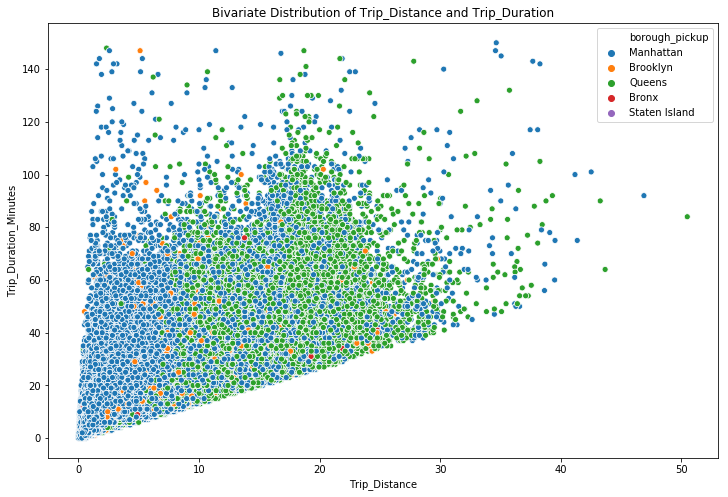

In [113]:
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Trip_Duration')
plt.title('Bivariate Distribution of Trip_Distance and Trip_Duration')
sns.scatterplot(data=gdf,x="Trip_Distance", y="Trip_Duration_Minutes",hue="borough_pickup")

#### Observation:
#### 1. There is a Cluster with a approximately linear Correlation

### 5. How is the Relation between Trip_Duration and Fare_Amt?

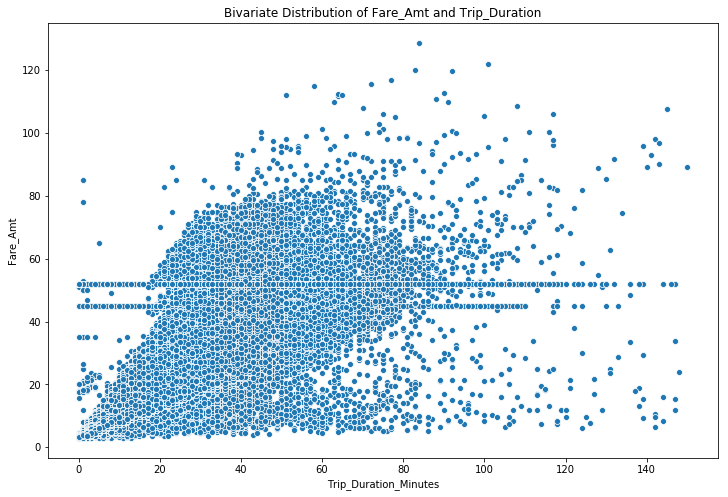

In [114]:
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Duration') 
plt.ylabel('Fare_Amt')
plt.title('Bivariate Distribution of Fare_Amt and Trip_Duration')
sns.scatterplot(data=gdf,x="Trip_Duration_Minutes", y="Fare_Amt")

#### Observation:
#### 1. The most Fare Amounts are between 20 and 90 Minutes

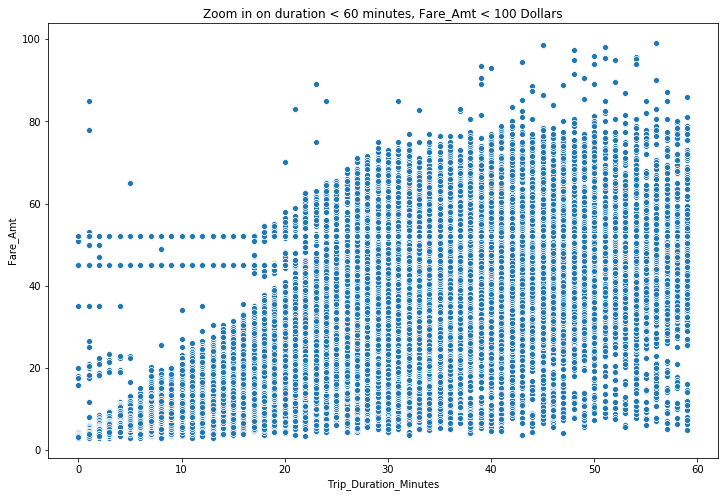

In [115]:
# zoom in on part of data
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Duration') 
plt.ylabel('Fare_Amt')
plt.title('Zoom in on duration < 60 minutes, Fare_Amt < 100 Dollars')
idx = (gdf.Trip_Duration_Minutes < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Duration_Minutes, y=gdf[idx].Fare_Amt)

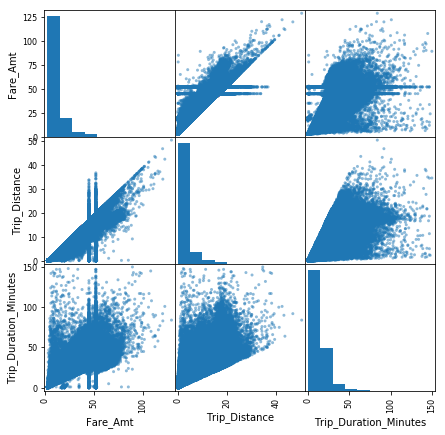

In [116]:
# Visualise the Columns Fare_Amt,Trip_Distance and Trip_Duration as Scattermatrix
pd.plotting.scatter_matrix(frame = gdf[['Fare_Amt', 'Trip_Distance', 'Trip_Duration_Minutes']], figsize=(7,7));

### 6. Does the Pick-up and Dropoff Location or Neighborhood affect the Fares?

### How is the Distribution of Pickups in Boroughs?

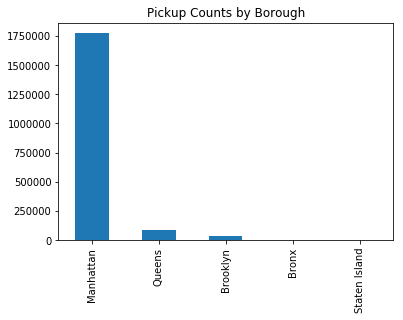

In [117]:
plt.title('Pickup Counts by Borough')
df_borough_pickup=gdf["borough_pickup"]
df_borough_pickup.value_counts().plot.bar()

#### Observation
#### 1. The most Pickups are in Manhattan
#### 2. The second most Pickups are in Queens

In [118]:
df_zone_pickup=gdf["zone_pickup"]
df_zone_pickup.value_counts()

Upper East Side South                            71720
Midtown Center                                   68641
East Village                                     65839
Times Sq/Theatre District                        65448
Midtown East                                     64352
Upper East Side North                            64172
Union Sq                                         63744
Murray Hill                                      63575
Clinton East                                     61132
Penn Station/Madison Sq West                     59236
Lincoln Square East                              54597
Gramercy                                         52026
Midtown North                                    51099
East Chelsea                                     49187
Midtown South                                    46140
Lenox Hill West                                  46123
Upper West Side South                            46004
West Village                                     44626
LaGuardia 

### How is the Distribution of Dropoffs in Boroughs?

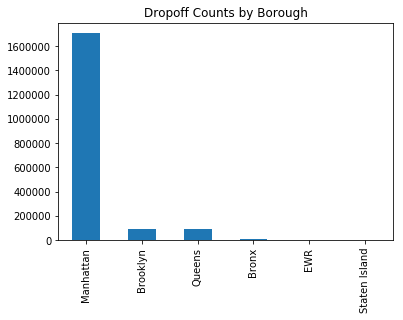

In [119]:
plt.title('Dropoff Counts by Borough')
df_borough_dropoff=gdf["borough_dropoff"]
df_borough_dropoff.value_counts().plot.bar()

#### Observation:
#### 1. The most dropoffs are in Manhattan
#### 2. The second most dropoffs are in Brooklyn
#### 3. The Third most dropoffs are in Queens

In [120]:
df_zone_dropoff=gdf["zone_dropoff"]
df_zone_dropoff.value_counts()

Midtown Center                                   76858
Times Sq/Theatre District                        64692
Upper East Side North                            63609
Upper East Side South                            63535
Murray Hill                                      62324
Midtown East                                     61001
Union Sq                                         56756
East Village                                     52692
Penn Station/Madison Sq West                     52656
Clinton East                                     51359
Lincoln Square East                              48825
Midtown North                                    47274
East Chelsea                                     45852
Lenox Hill West                                  43726
Gramercy                                         43467
Upper West Side South                            43091
Midtown South                                    42361
West Village                                     36394
TriBeCa/Ci

### What is the Average Fare by Borough_pickup?

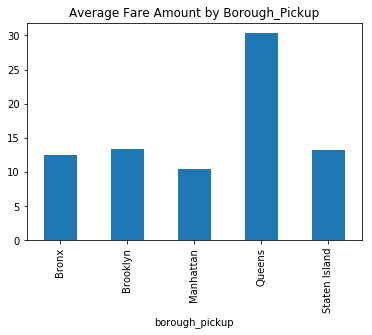

In [121]:
plt.title('Average Fare Amount by Borough_Pickup')
gdf.groupby("borough_pickup")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. Queens has the highest Average Fare Amount in Pickups, maybe because of Trips to JFK Airport
#### 2. Brooklyn has the second highest Average Fare Amount in Pickups

In [122]:
gdf.groupby("zone_pickup")["Fare_Amt"].agg("mean").sort_values(ascending =False)

zone_pickup
Rockaway Park                       55.892979
New Dorp/Midland Beach              47.556553
Baisley Park                        44.961700
JFK Airport                         43.994610
South Jamaica                       43.890285
Springfield Gardens South           38.610050
Flushing Meadows-Corona Park        34.370205
West Brighton                       33.349609
Eastchester                         32.355469
Jamaica                             32.050880
LaGuardia Airport                   29.304352
Hammels/Arverne                     29.184896
Rosedale                            28.120508
Broad Channel                       27.620443
Starrett City                       27.592611
South Ozone Park                    27.222322
Grymes Hill/Clifton                 26.838339
Cambria Heights                     26.004185
Randalls Island                     24.621086
Briarwood/Jamaica Hills             24.364735
Jamaica Bay                         23.683132
Laurelton             

### What is the Average Fare by Borough_dropoff?

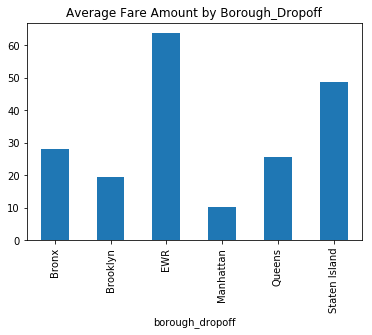

In [123]:
plt.title('Average Fare Amount by Borough_Dropoff')
gdf.groupby("borough_dropoff")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. The Newark Airport has the highest Fare Amount in Dropoffs
#### 2. Staten Island has the second highest Fare Amount in Dropoffs

In [124]:
gdf.groupby("zone_dropoff")["Fare_Amt"].agg("mean").sort_values(ascending =False)

zone_dropoff
Rossville/Woodrow                      74.000000
Arden Heights                          68.483727
Eltingville/Annadale/Prince's Bay      66.964287
Charleston/Tottenville                 66.431198
Great Kills                            65.803589
Newark Airport                         63.773312
Port Richmond                          59.440289
Breezy Point/Fort Tilden/Riis Beach    55.950344
Oakwood                                52.728516
Westerleigh                            51.994976
Saint George/New Brighton              51.981480
New Dorp/Midland Beach                 51.847706
Rockaway Park                          50.929825
West Brighton                          50.414772
Bloomfield/Emerson Hill                47.845043
Grymes Hill/Clifton                    47.069500
JFK Airport                            46.907379
Coney Island                           46.587414
Manhattan Beach                        45.838696
City Island                            45.345947
Sheepsh

### How about the Fare Distribution of Pickups and Dropoffs in Boroughs?

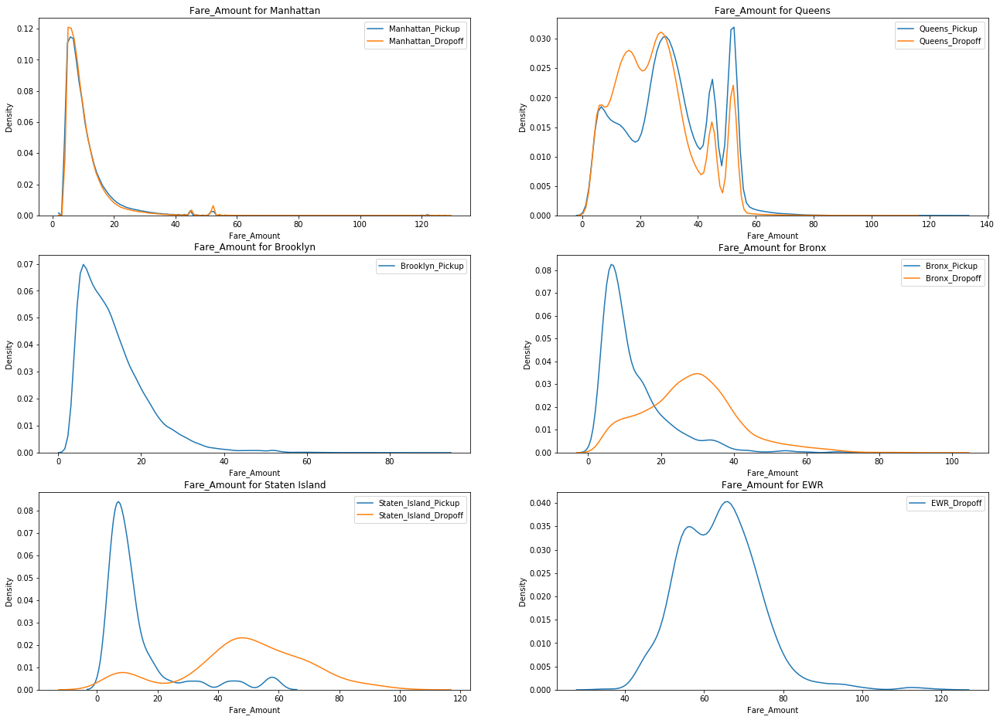

In [125]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Fare_Amount for Manhattan')
axs[0][0].set_xlabel("Fare_Amount")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Manhattan","Fare_Amt"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Manhattan","Fare_Amt"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Fare_Amount for Queens')
axs[0][1].set_xlabel("Fare_Amount")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Queens","Fare_Amt"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Queens","Fare_Amt"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Fare_Amount for Brooklyn')
axs[1][0].set_xlabel("Fare_Amount")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Brooklyn","Fare_Amt"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Brookyln","Fare_Amt"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Fare_Amount for Bronx')
axs[1][1].set_xlabel("Fare_Amount")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Bronx","Fare_Amt"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Bronx","Fare_Amt"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Fare_Amount for Staten Island')
axs[2][0].set_xlabel("Fare_Amount")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Staten Island","Fare_Amt"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Staten Island","Fare_Amt"],ax=axs[2][0], label="Staten_Island_Dropoff")

axs[2][1].set_title('Fare_Amount for EWR')
axs[2][1].set_xlabel("Fare_Amount")
axs[2][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="EWR","Fare_Amt"],ax=axs[2][1], label="EWR_Dropoff")

#### Observation:
#### 1.There are differences in pickups and dropoffs of Fare Amounts in each Borough except Manhattan.
#### 2.The Pickups from Queens is more expensive compared to pickups in other Boroughs
#### 3. High Differences in Pickup and Dropoff Prices in Staten Island 

### How about the Trip_Distance Distribution of Pickups and Dropoffs in Boroughs?

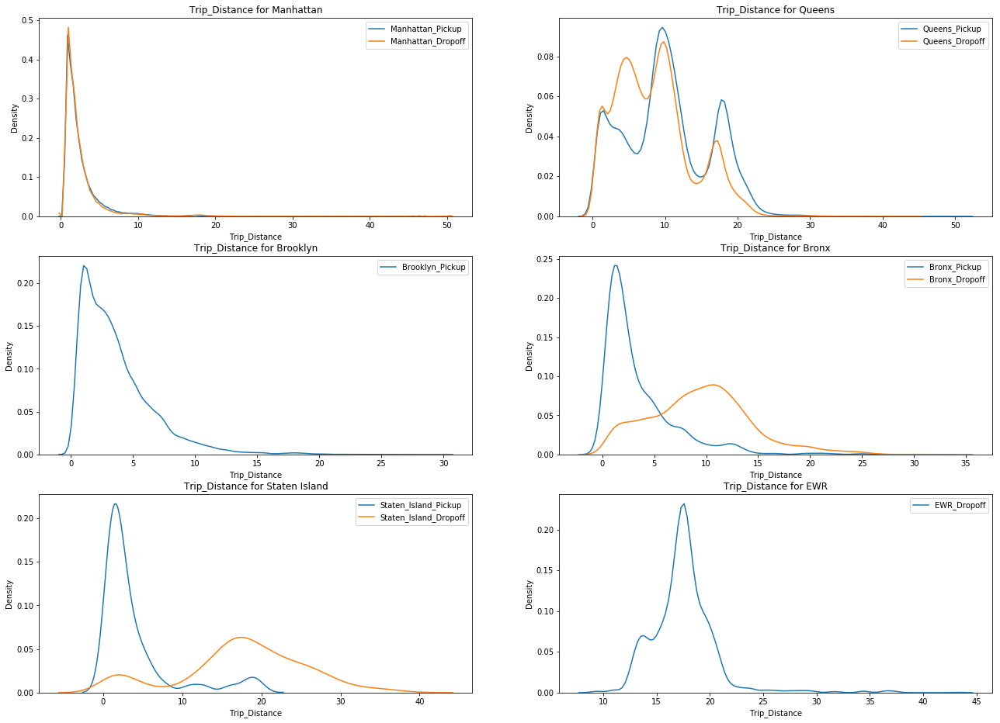

In [126]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Trip_Distance for Manhattan')
axs[0][0].set_xlabel("Trip_Distance")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Manhattan","Trip_Distance"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Manhattan","Trip_Distance"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Trip_Distance for Queens')
axs[0][1].set_xlabel("Trip_Distance")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Queens","Trip_Distance"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Queens","Trip_Distance"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Trip_Distance for Brooklyn')
axs[1][0].set_xlabel("Trip_Distance")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Brooklyn","Trip_Distance"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Brookyln","Trip_Distance"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Trip_Distance for Bronx')
axs[1][1].set_xlabel("Trip_Distance")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Bronx","Trip_Distance"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Bronx","Trip_Distance"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Trip_Distance for Staten Island')
axs[2][0].set_xlabel("Trip_Distance")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Staten Island","Trip_Distance"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Staten Island","Trip_Distance"],ax=axs[2][0], label="Staten_Island_Dropoff")

axs[2][1].set_title('Trip_Distance for EWR')
axs[2][1].set_xlabel("Trip_Distance")
axs[2][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="EWR","Trip_Distance"],ax=axs[2][1], label="EWR_Dropoff")

#### Observation:
#### 1. Dropoffs to Bronx and Staten Island are long Trips.
#### 2. Even here Manhattan has the same Distribution for Trip Distance

### How about the Trip_Duration Distribution of Pickups and Dropoffs in Boroughs?

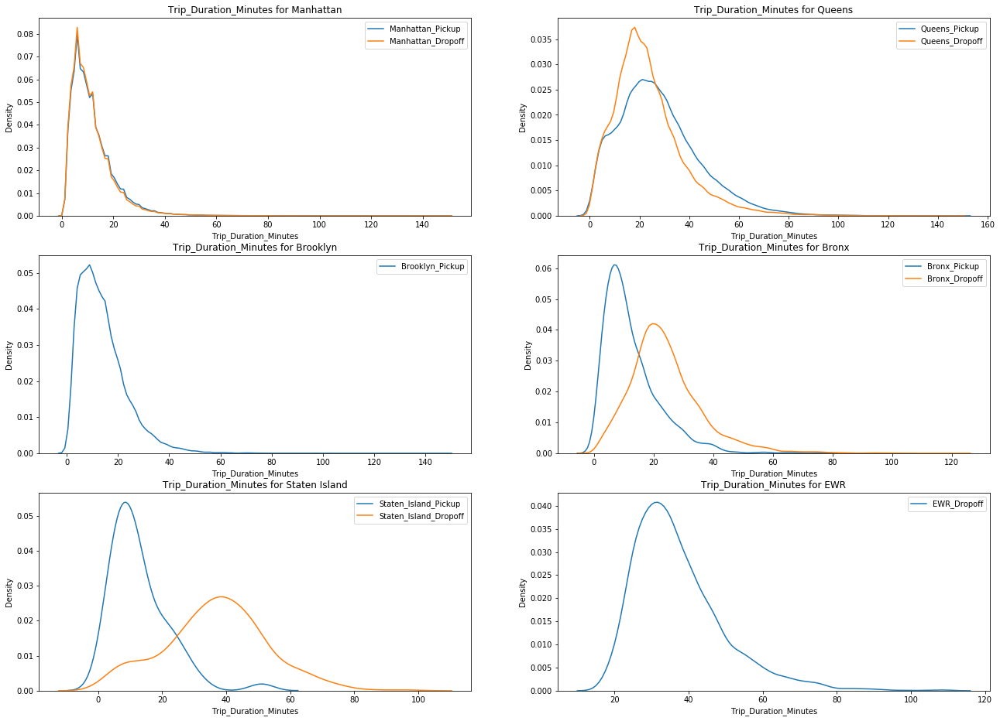

In [127]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Trip_Duration_Minutes for Manhattan')
axs[0][0].set_xlabel("Trip_Duration_Minutes")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Manhattan","Trip_Duration_Minutes"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Manhattan","Trip_Duration_Minutes"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Trip_Duration_Minutes for Queens')
axs[0][1].set_xlabel("Trip_Duration_Minutes")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Queens","Trip_Duration_Minutes"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Queens","Trip_Duration_Minutes"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Trip_Duration_Minutes for Brooklyn')
axs[1][0].set_xlabel("Trip_Duration_Minutes")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Brooklyn","Trip_Duration_Minutes"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Brookyln","Trip_Duration_Minutes"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Trip_Duration_Minutes for Bronx')
axs[1][1].set_xlabel("Trip_Duration_Minutes")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Bronx","Trip_Duration_Minutes"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Bronx","Trip_Duration_Minutes"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Trip_Duration_Minutes for Staten Island')
axs[2][0].set_xlabel("Trip_Duration_Minutes")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_pickup"]=="Staten Island","Trip_Duration_Minutes"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="Staten Island","Trip_Duration_Minutes"],ax=axs[2][0], label="Staten_Island_Dropoff")

axs[2][1].set_title('Trip_Duration_Minutes for EWR')
axs[2][1].set_xlabel("Trip_Duration_Minutes")
axs[2][1].set_ylabel("Density")
sns.kdeplot(data=gdf.loc[gdf["borough_dropoff"]=="EWR","Trip_Duration_Minutes"],ax=axs[2][1], label="EWR_Dropoff")

#### Observation
#### 1. Dropoffs Staten Island tend to be longer Trip Duration
#### 2. Even here Manhattan has  almost the same Distribution for Trip Duration
#### 3. The Distribution of Pickups are everywhere almost the same except for Queens

### Where do the long Trip Distance originate and end?
#### Long Distances are over 10 Miles, because a Trip from Hamburg to Harburg is round about 10 Miles
#### We know Trip_Distance and Fare_Amt has a linear Relationship

#### Long Trip Distance Pickup

In [128]:
#1. Plot on Map to see where does these Trips happen
Pickup_High_Distance=gdf.loc[(gdf["Trip_Distance"]>=20) & ((gdf["Manhattan_JFK_Airport_Trip"]!=True))]

Pickup_High_Distance=Pickup_High_Distance[['Pickup_Lat','Pickup_Lon']]

In [129]:
########################Lat,Lon#################################
m_Pickup_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Pickup_High_Distance.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Pickup_High_Distance)

In [130]:
m_Pickup_High_Distance

#### Observation:
#### 1.Most of the Long Distances originates in Lower and Midtown Manhattan and Airports

#### Long Trip Distance Dropoff

In [131]:
#1. Plot on Map to see where does these Trips happen
Dropoff_High_Distance=gdf.loc[(gdf["Trip_Distance"]>=20) & ((gdf["Manhattan_JFK_Airport_Trip"]!=True))]

Dropoff_High_Distance=Dropoff_High_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [132]:
########################Lat,Lon#################################
m_Dropoff_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Dropoff_High_Distance.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Dropoff_High_Distance)

In [133]:
m_Dropoff_High_Distance

#### Observation:
#### 1. Most Dropoffs are in Manhattan, Brooklyn, Airports

### Create Feature "is_area_lower_midtown_manhattan" to differentiate between Rest of Manhattan

#### For getting a Bounding Box for Lower and Midtown Manhattan go to [Bounding Box:](https://boundingbox.klokantech.com/)

In [134]:
# Coordinates of Bounding Box:-74.037727,40.690513,-73.946953,40.776624
# At the Beginning set it to False and if the Coordinate is in Bounding Box set it to True
gdf["Pickup_Is_Area_Lower_Midtown_Manhattan"]=False
gdf["Dropoff_Is_Area_Lower_Midtown_Manhattan"]=False
gdf.loc[(gdf['Pickup_Lat'].between(40.690513, 40.776624)) & (gdf['Pickup_Lon'].between(-74.037727, -73.946953)),["Pickup_Is_Area_Lower_Midtown_Manhattan"]]=True
gdf.loc[(gdf['Dropoff_Lat'].between(40.690513, 40.776624)) & (gdf['Dropoff_Lon'].between(-74.037727, -73.946953)),["Dropoff_Is_Area_Lower_Midtown_Manhattan"]]=True 

### How does the Distribution of the Fare Amount look like in Lower and Midtown Manhattan vs. Rest of Manhattan for Pickups?

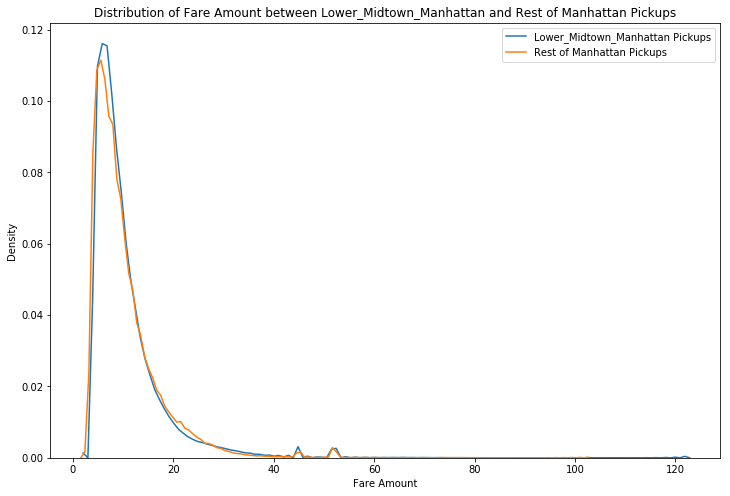

In [135]:
# Dataframe with sorted Passenger Count and Fare Amount
df_is_area_lower_midtown_manhattan_fare=gdf[["borough_pickup","Pickup_Is_Area_Lower_Midtown_Manhattan","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount between Lower_Midtown_Manhattan and Rest of Manhattan Pickups")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (df_is_area_lower_midtown_manhattan_fare["borough_pickup"]=="Manhattan"),"Fare_Amt"], label="Lower_Midtown_Manhattan Pickups")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (df_is_area_lower_midtown_manhattan_fare["borough_pickup"]=="Manhattan"),"Fare_Amt"], label="Rest of Manhattan Pickups")

#### Observation:
#### 1. Almost the same

### How does the Distribution of the Fare Amount look like in Lower and Midtown Manhattan vs. Rest of Manhattan for Dropoffs?

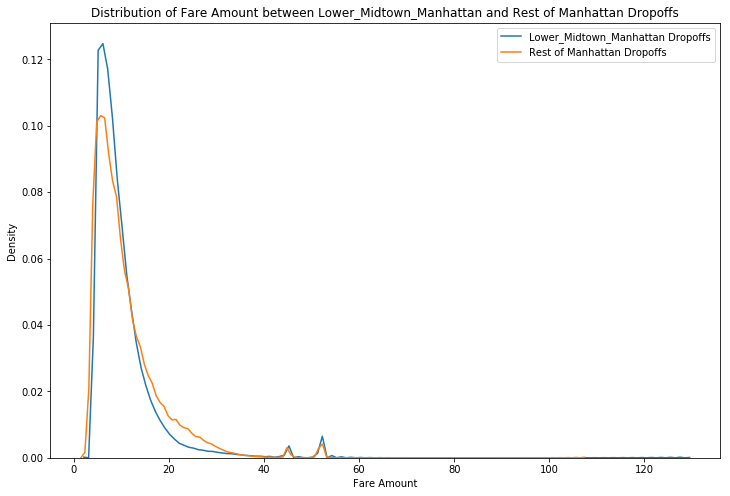

In [136]:
# Dataframe with sorted Passenger Count and Fare Amount
df_is_area_lower_midtown_manhattan_fare=gdf[["borough_dropoff","Dropoff_Is_Area_Lower_Midtown_Manhattan","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount between Lower_Midtown_Manhattan and Rest of Manhattan Dropoffs")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (df_is_area_lower_midtown_manhattan_fare["borough_dropoff"]=="Manhattan"),"Fare_Amt"], label="Lower_Midtown_Manhattan Dropoffs")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (df_is_area_lower_midtown_manhattan_fare["borough_dropoff"]=="Manhattan"),"Fare_Amt"], label="Rest of Manhattan Dropoffs")

### What about the Distribution of Trip_Distance and Fare_Amt of Lower_Midtown Manhattan vs Rest of Manhattan?

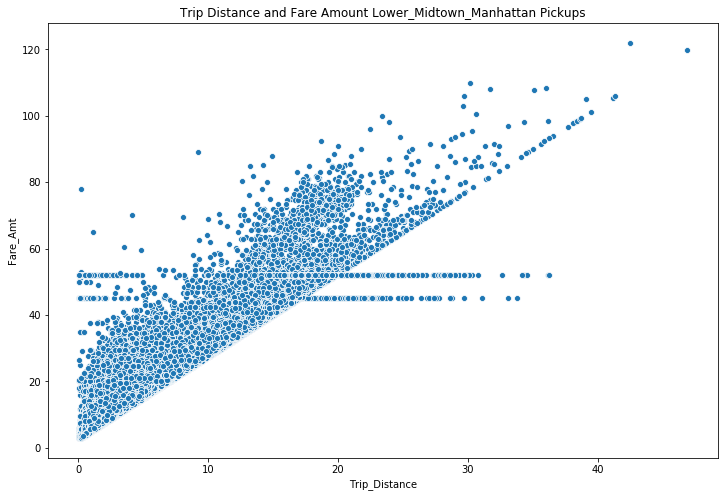

In [137]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Lower_Midtown_Manhattan Pickups')
sns.scatterplot(data=gdf,x=gdf.loc[(gdf["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf["borough_pickup"]=="Manhattan"),"Trip_Distance"], y=gdf.loc[(gdf["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf["borough_pickup"]=="Manhattan"),"Fare_Amt"])

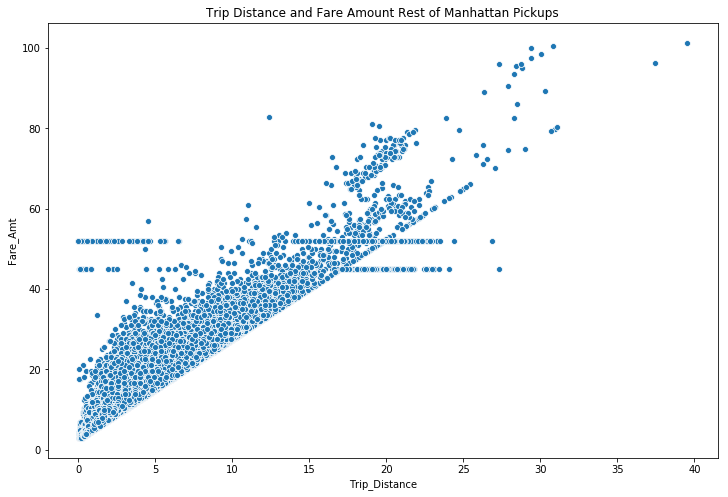

In [138]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Rest of Manhattan Pickups')
sns.scatterplot(data=gdf,x=gdf.loc[(gdf["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf["borough_pickup"]=="Manhattan"),"Trip_Distance"], y=gdf.loc[(gdf["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf["borough_pickup"]=="Manhattan"),"Fare_Amt"])

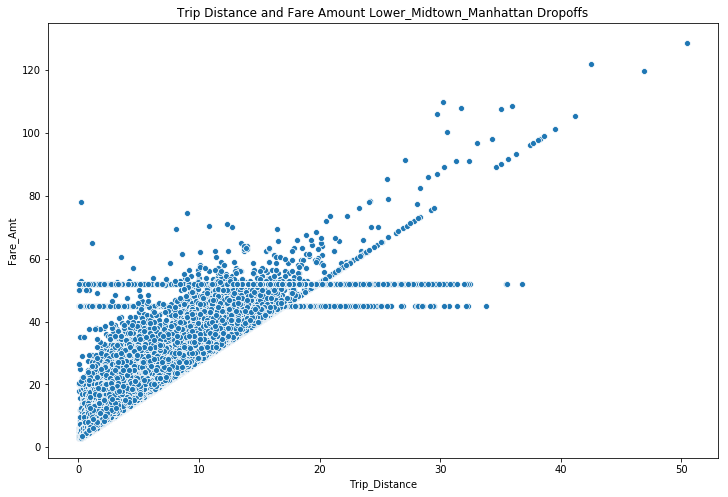

In [139]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Lower_Midtown_Manhattan Dropoffs')
sns.scatterplot(data=gdf,x=gdf.loc[(gdf["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf["borough_dropoff"]=="Manhattan"),"Trip_Distance"], y=gdf.loc[(gdf["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf["borough_dropoff"]=="Manhattan"),"Fare_Amt"])

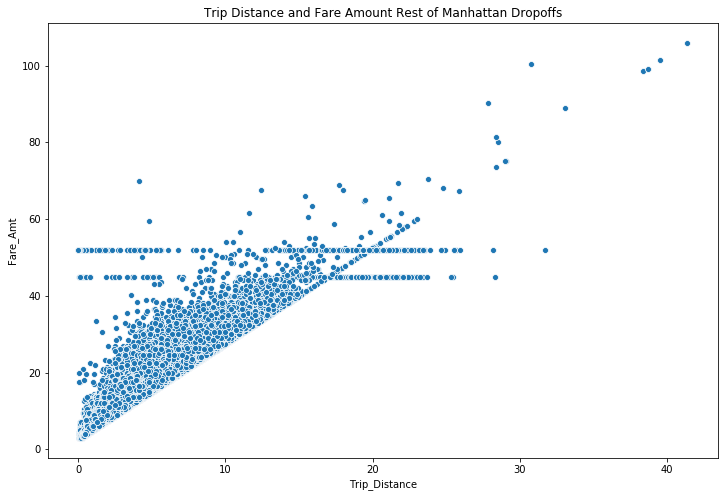

In [140]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Rest of Manhattan Dropoffs')
sns.scatterplot(data=gdf,x=gdf.loc[(gdf["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf["borough_dropoff"]=="Manhattan"),"Trip_Distance"], y=gdf.loc[(gdf["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf["borough_dropoff"]=="Manhattan"),"Fare_Amt"])

### 7.What is the Relationship between the Time and the Fare?

#### How does the Amount of Trips developed over the Years?

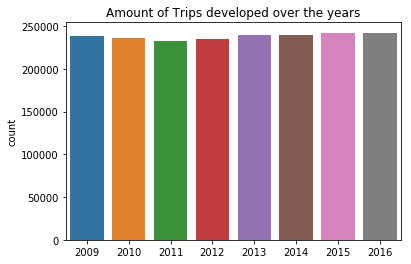

In [141]:
#extract pickup_year and value counts of Dataframe
df_year=gdf["Pickup_Year"].value_counts()
df_year=df_year.to_frame(name="count")
# Plot the Amount of Trips developed over the years
plt.title("Amount of Trips developed over the years")
sns.barplot(x=df_year.index,y="count",data=df_year)

#### Observation:
#### 1. The Amount of Trips are almost the same

### How does the average Fare Amount developed over the years?

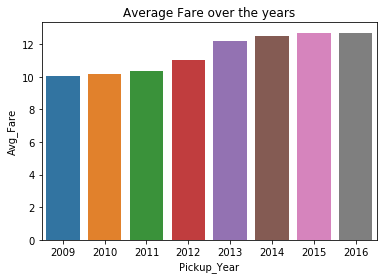

In [142]:
#extract pickup_year and Fare_Amt of Dataframe
df_year_fare=data=gdf.groupby("Pickup_Year")["Fare_Amt"].mean()
df_year_fare=df_year_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the years")
sns.barplot(x=df_year_fare.index,y="Avg_Fare",data=df_year_fare)

#### Observation:
#### 1. The Average Fare Amount has increased over the Years

### What about the Number of Pickups and Average Fare Amount over the months?

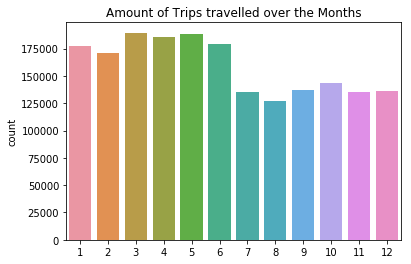

In [143]:
#extract pickup_year and value counts of Dataframe
df_month=gdf["Pickup_Month"].value_counts()
df_month=df_month.to_frame(name="count")
# Plot the Amount of Trips developed over the years
plt.title("Amount of Trips travelled over the Months")
sns.barplot(x=df_month.index,y="count",data=df_month)

#### Observation:
#### 1. Number of Trips are lower from July to December

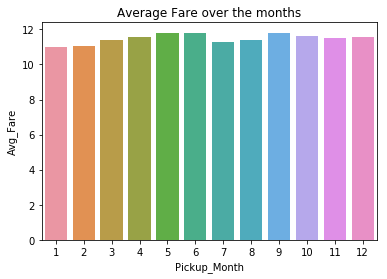

In [144]:
#extract pickup_year and Fare_Amt of Dataframe
df_month_fare=data=gdf.groupby("Pickup_Month")["Fare_Amt"].mean()
df_month_fare=df_month_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the months")
sns.barplot(x=df_month_fare.index,y="Avg_Fare",data=df_month_fare)

#### The Average Fare Amount across the Months look constant

### How does the Fare Amount look like for Day in Month?

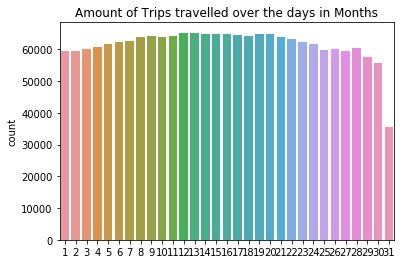

In [145]:
#extract pickup_year and value counts of Dataframe
df_day=gdf["Pickup_Day"].value_counts()
df_day=df_day.to_frame(name="count")
# Plot the Amount of Trips developed over the years
plt.title("Amount of Trips travelled over the days in Months")
sns.barplot(x=df_day.index,y="count",data=df_day)

#### Observation
#### 1. There is a drop in 31

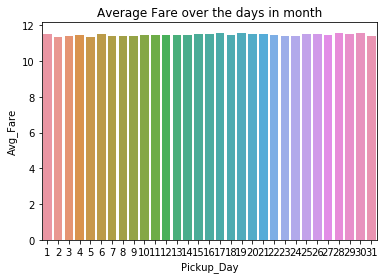

In [146]:
#extract pickup_year and Fare_Amt of Dataframe
df_day_fare=data=gdf.groupby("Pickup_Day")["Fare_Amt"].mean()
df_day_fare=df_day_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the days in month")
sns.barplot(x=df_day_fare.index,y="Avg_Fare",data=df_day_fare)

#### Observation:
#### 1. Almost the same

### What about the Number of Pickups and Average Fare Amount over Day of Weeks?

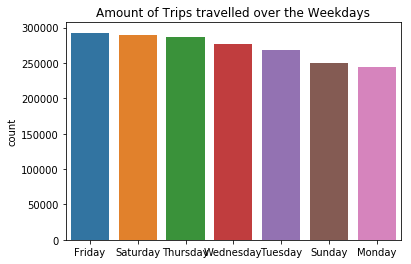

In [147]:
#extract pickup_weekday and value counts of Dataframe
df_weekday=gdf["Pickup_Weekday"].value_counts()
df_weekday=df_weekday.to_frame(name="count")
# Plot the Amount of Trips developed over the weekdays
plt.title("Amount of Trips travelled over the Weekdays")
sns.barplot(x=df_weekday.index,y="count",data=df_weekday)

#### Observation:
#### 1. The most Trips are on Friday,Saturday and Thursday

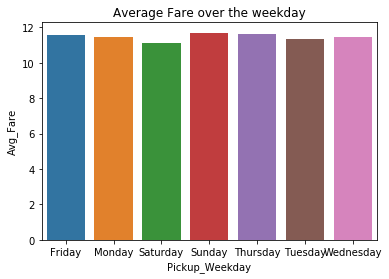

In [148]:
#extract pickup_year and Fare_Amt of Dataframe
df_weekday_fare=data=gdf.groupby("Pickup_Weekday")["Fare_Amt"].mean()
df_weekday_fare=df_weekday_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the weekday")
sns.barplot(x=df_weekday_fare.index,y="Avg_Fare",data=df_weekday_fare)

#### Observation:
#### 1. Saturday has low avg fare amount, compared to other days though there are a lot of trips of saturday. On sunday and monday though the number of trips are lower, avg fare amount is higher

### What about the Number of Pickups and Average Fare Amount over Hour of Days?

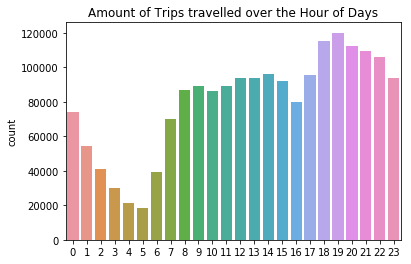

In [149]:
#extract pickup_hour and value counts of Dataframe
df_hour=gdf["Pickup_Hour"].value_counts()
df_hour=df_hour.to_frame(name="count")
# Plot the Amount of Trips developed over the weekdays
plt.title("Amount of Trips travelled over the Hour of Days")
sns.barplot(x=df_hour.index,y="count",data=df_hour)

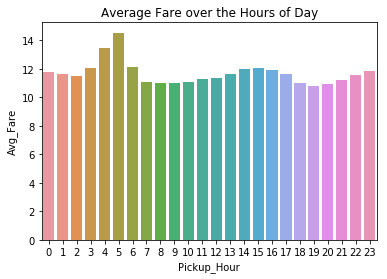

In [150]:
#extract pickup_year and Fare_Amt of Dataframe
df_hour_fare=data=gdf.groupby("Pickup_Hour")["Fare_Amt"].mean()
df_hour_fare=df_hour_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the Hours of Day")
sns.barplot(x=df_hour_fare.index,y="Avg_Fare",data=df_hour_fare)

#### Observation:
#### 1. The avg fare amount at 5am is the higher while the number of trips at 5 am are the least. -> Trips to Airport
#### 2.The number of trips are highest in 18 and 19 hours -> Trips to Night Clubs and Nightlife

### 8.How is the Relation of RateCodeID to Fare Amount?

### How is the Distribution of RateCodeID's?

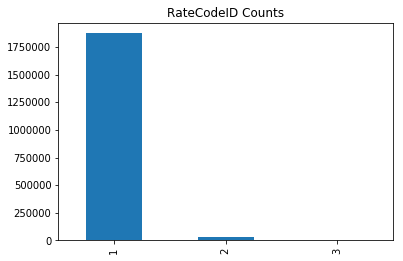

In [151]:
plt.title('RateCodeID Counts')
df_borough_pickup=gdf["RateCodeID"]
df_borough_pickup.value_counts().plot.bar()

#### Observation
#### 1. The most Trips are RateCodeID 1
#### 2. The second most Trips are RateCodeID 2

### What is the Average Fare for RateCodeID's?

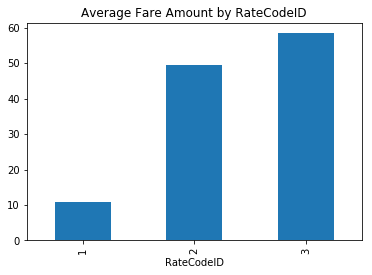

In [152]:
plt.title('Average Fare Amount by RateCodeID')
gdf.groupby("RateCodeID")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. RateCodeID 3 has the highest average Fare Amount 
#### 2. RateCodeID 2 has the second highest average Fare Amount
#### 3. RateCodeID 1 has the third highest Fare Amount

### How is the Distribution of Fare_Amount by RateCodeID?

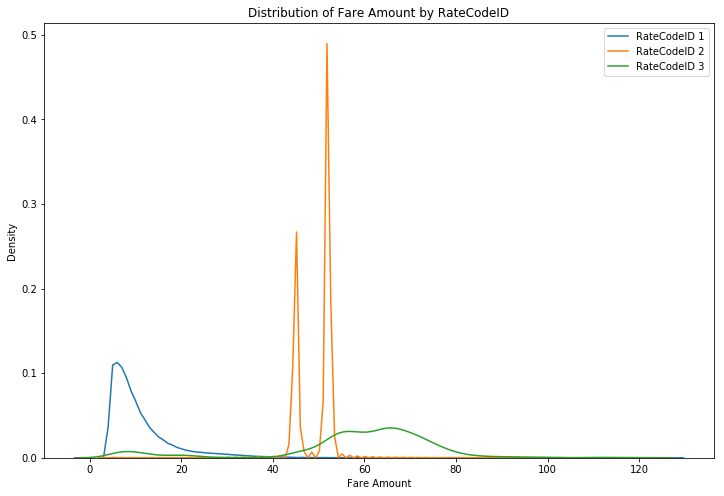

In [153]:
# Dataframe with sorted Passenger Count and Fare Amount
df_rate_fare=gdf[["RateCodeID","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount by RateCodeID")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==1,"Fare_Amt"], label="RateCodeID 1")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==2,"Fare_Amt"], label="RateCodeID 2")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==3,"Fare_Amt"], label="RateCodeID 3")

#### Observation:
#### 1. Most of the Trips of RateCodeID 2 has high Fare Amounts
#### 2. RateCodeID 1 has more small Fare Amounts
#### 3. RateCodeID 3 has high Fare Amounts, but not so frequently

### 9. How does the Fare Amount developed over the Time?

### How does the Fare Amount developed over the Years?

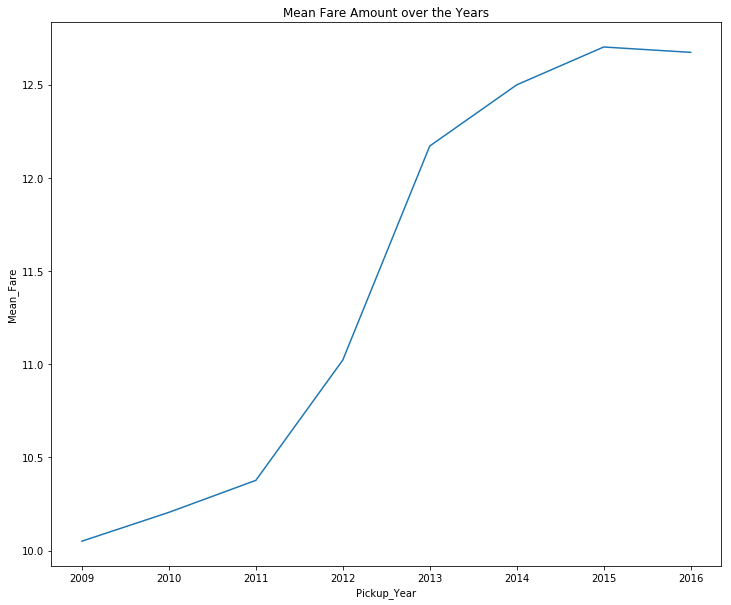

In [154]:
df_year_fare_mean=gdf.groupby("Pickup_Year")["Fare_Amt"].mean()
df_year_fare_mean=df_year_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Years")
sns.lineplot(x=df_year_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_year_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf)

#### Observation:
#### 1. There is a tremendous Fare increase between 2011 and 2013 ->

### How does the Fare Amount developed over the Months?

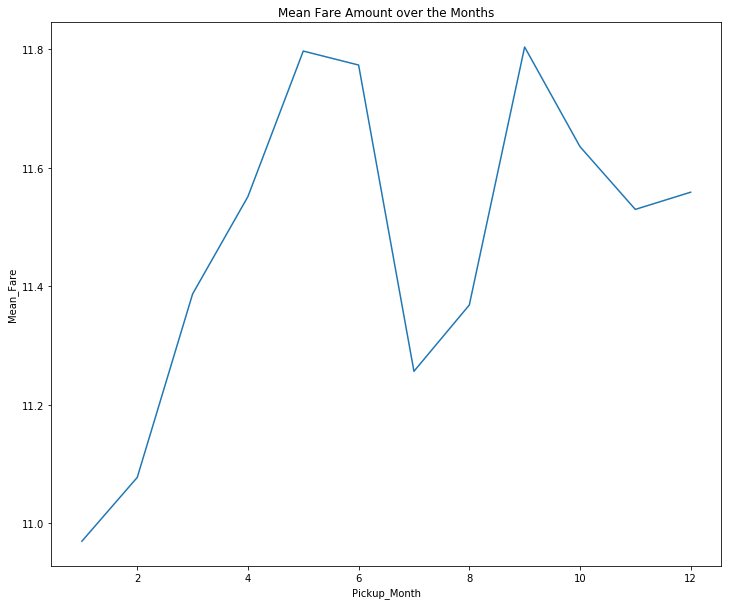

In [155]:
df_month_fare_mean=gdf.groupby("Pickup_Month")["Fare_Amt"].mean()
df_month_fare_mean=df_month_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Months")
sns.lineplot(x=df_month_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_month_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf)

#### Observation:
#### 1. The Fare Amount dropped tremendously at beginning in June -> less Trips beginning in July

### How does the Fare Amount developed over the Days in Months?

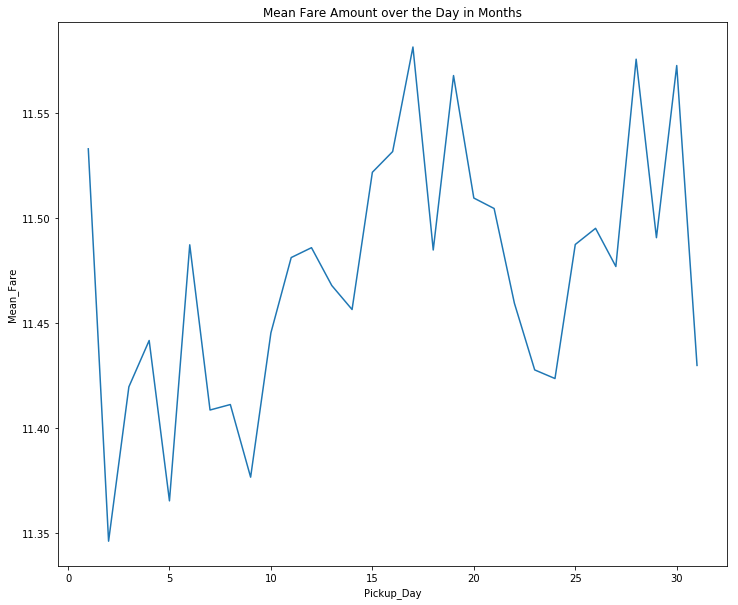

In [156]:
df_day_fare_mean=gdf.groupby("Pickup_Day")["Fare_Amt"].mean()
df_day_fare_mean=df_day_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Day in Months")
sns.lineplot(x=df_day_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_day_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf)

### How does the Fare Amount developed over the Days?

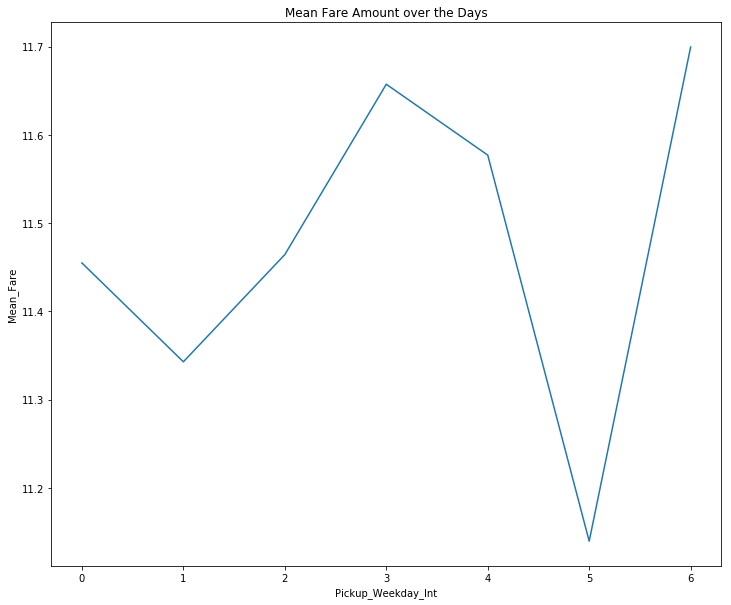

In [157]:
df_weekday_fare_mean=gdf.groupby("Pickup_Weekday_Int")["Fare_Amt"].mean()
df_weekday_fare_mean=df_weekday_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Days")
sns.lineplot(x=df_weekday_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_weekday_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf)

#### Observation:
#### 1. The Fare Amount dropped tremendously at Friday

### How does the Fare Amount developed over the Hours?

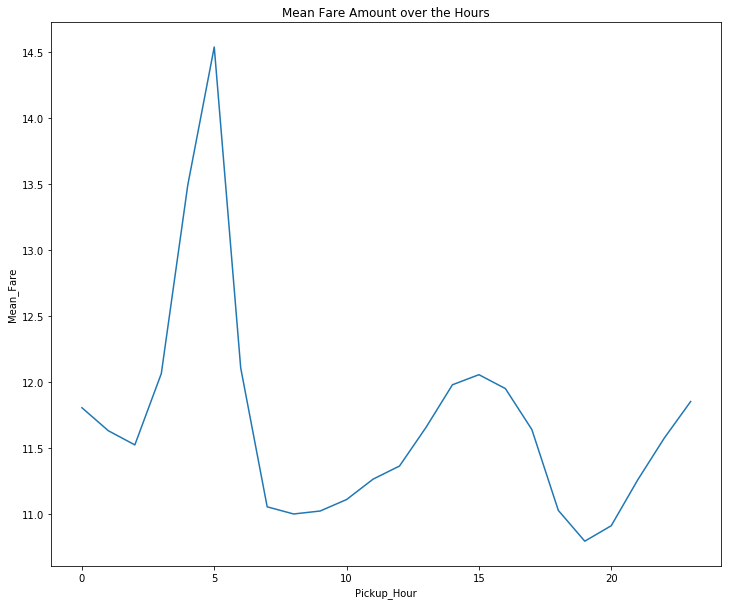

In [158]:
df_hour_fare_mean=gdf.groupby("Pickup_Hour")["Fare_Amt"].mean()
df_hour_fare_mean=df_hour_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Hours")
sns.lineplot(x=df_hour_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_hour_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf)

#### Observation:
#### 1. At 5 am are the least Trips

### How does the Fare Amount changed for each Year?

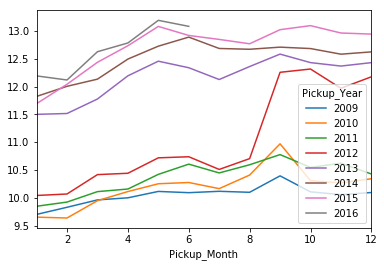

In [159]:
df_year_month_fare_mean=gdf.groupby(["Pickup_Month","Pickup_Year"])["Fare_Amt"].mean()
df_year_month_fare_mean=df_year_month_fare_mean.unstack()
df_year_month_fare_mean.plot()

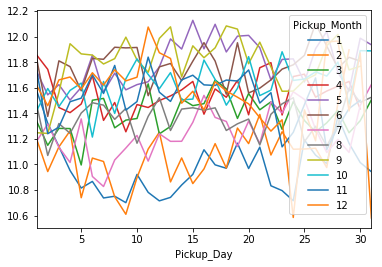

In [160]:
df_day_month_fare_mean=gdf.groupby(["Pickup_Day","Pickup_Month"])["Fare_Amt"].mean()
df_day_month_fare_mean=df_day_month_fare_mean.unstack()
df_day_month_fare_mean.plot()

In [161]:
# How many Data is left?
origin_length=2000000
print(str(len(gdf)/origin_length *100) + " "+ " % is left of the origin")

95.31255  % is left of the origin


In [162]:
gdf

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed,Pickup_Is_Area_Lower_Midtown_Manhattan,Dropoff_Is_Area_Lower_Midtown_Manhattan
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,1,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan,False,False,2009,00:09:00,540.0,9.0,1.862852,7.749023,7.157130,False,False,False,6,4,Thursday,3,22,22.0,True,True
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,1,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan,False,False,2009,00:28:00,1680.0,28.0,2.496187,12.695312,8.740468,False,False,False,6,6,Saturday,5,22,14.0,True,True
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,1,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan,False,False,2009,00:08:00,480.0,8.0,0.712135,4.499512,4.280337,False,False,False,6,19,Friday,4,17,9.0,True,True
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.221074,-73.956551,40.771511,1,8.052684,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan,False,False,2009,00:06:05,365.0,6.0,2.221074,7.998047,8.052684,True,True,False,1,18,Sunday,6,19,35.0,True,True
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,1,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan,False,False,2009,00:12:02,722.0,12.0,0.889383,5.749512,4.723458,False,False,False,7,13,Monday,0,9,10.0,True,True
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,1,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan,False,False,2009,00:17:00,1020.0,17.0,2.411086,8.974609,8.527715,False,False,False,9,15,Tuesday,1,18,14.0,True,True
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,1,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan,False,False,2009,00:10:00,600.0,10.0,2.242142,8.422852,8.105356,False,False,False,5,2,Saturday,5,20,22.0,False,False
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,1,9.501953,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan,False,False,2009,00:06:25,385.0,6.0,1.860050,9.501953,7.150124,False,False,True,2,14,Saturday,5,5,42.0,False,True
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,1,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan,False,False,2009,00:20:08,1208.0,20.0,3.757682,13.496094,11.894205,False,False,False,

In [163]:
gdf.describe()

,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,LocationID_pickup,Dropoff_Lon,Dropoff_Lat,LocationID_dropoff,Pickup_Year,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,Pickup_Month,Pickup_Day,Pickup_Weekday_Int,Pickup_Hour,Speed
count,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1906251,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06,1.906251e+06
mean,1.687035e+00,2.866109e+00,-7.397554e+01,4.075101e+01,1.018464e+00,1.147380e+01,1.607788e+02,-7.397472e+01,4.075147e+01,1.590578e+02,2.012522e+03,0 days 00:12:49.812958,7.698130e+02,1.252122e+01,2.076175e+00,9.619725e+00,7.690441e+00,6.090641e+00,1.570375e+01,3.039914e+00,1.354063e+01,1.997317e+01
std,1.309357e+00,3.265264e+00,3.394044e-02,2.654218e-02,1.442496e-01,8.848258e+00,6.638901e+01,3.253141e-02,3.044420e-02,6.927514e+01,2.296948e+00,0 days 00:09:35.792393,5.757924e+02,9.597644e+00,2.204863e+00,8.165177e+00,5.512157e+00,3.417017e+00,8.689117e+00,1.948457e+00,6.489500e+00,1.018300e+01
min,1.000000e+00,1.000214e-02,-7.423065e+01,4.051488e+01,1.000000e+00,2.900391e+00,2.000000e+00,-7.424289e+01,4.050939e+01,1.000000e+00,2.009000e+03,0 days 00:00:03,3.000000e+00,0.000000e+00,2.362194e-04,2.525005e+00,2.500591e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,1.000000e+00,1.066024e+00,-7.399224e+01,4.073682e+01,1.000000e+00,6.101562e+00,1.130000e+02,-7.399151e+01,4.073579e+01,1.070000e+02,2.011000e+03,0 days 00:06:18,3.780000e+02,6.000000e+00,7.962738e-01,5.100098e+00,4.490685e+00,3.000000e+00,8.000000e+00,1.000000e+00,9.000000e+00,1.300000e+01
50%,1.000000e+00,1.790039e+00,-7.398211e+01,4.075348e+01,1.000000e+00,8.500000e+00,1.610000e+02,-7.398055e+01,4.075401e+01,1.610000e+02,2.013000e+03,0 days 00:10:18,6.180000e+02,1.000000e+01,1.347233e+00,6.899414e+00,5.868083e+00,6.000000e+00,1.600000e+01,3.000000e+00,1.400000e+01,1.800000e+01
75%,2.000000e+00,3.199219e+00,-7.396846e+01,4.076767e+01,1.000000e+00,1.300000e+01,2.310000e+02,-7.396530e+01,4.076855e+01,2.310000e+02,2.015000e+03,0 days 00:16:20,9.800000e+02,1.600000e+01,2.437888e+00,1.042480e+01,8.594719e+00,9.000000e+00,2.300000e+01,5.000000e+00,1.900000e+01,2.400000e+01
max,6.000000e+00,5.050000e+01,-7.371025e+01,4.091128e+01,3.000000e+00,1.287500e+02,2.630000e+02,-7.370098e+01,4.091288e+01,2.630000e+02,2.016000e+03,0 days 02:30:00,9.000000e+03,1.500000e+02,2.448074e+01,1.287500e+02,6.370184e+01,1.200000e+01,3.100000e+01,6.000000e+00,2.300000e+01,7.000000e+01


### How does the Airport Destination Newark Airport affect the Fare?

In [164]:
# Trips with Destination Newark Airport
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf["Is_Destination_Newark_Airport"]=False
gdf.loc[(gdf['zone_dropoff'] == "Newark Airport"),['Is_Destination_Newark_Airport']] = True

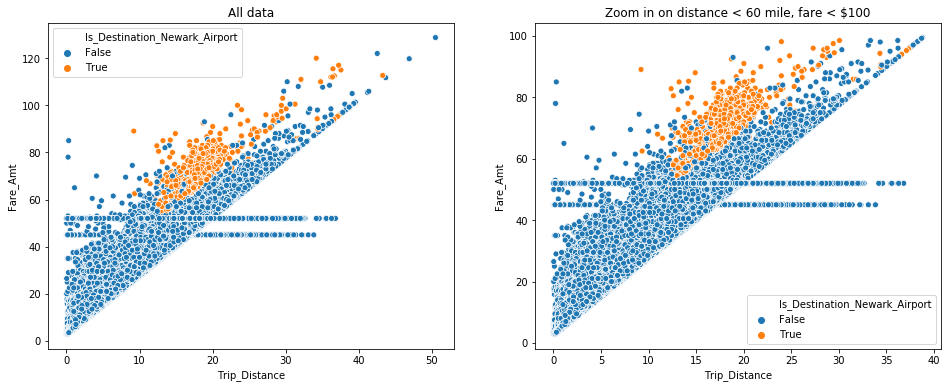

In [165]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Is_Destination_Newark_Airport")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Is_Destination_Newark_Airport")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### How does Trips from and to La Guardia Airport affect the Fare Amount?

In [166]:
# Trips with Destination Newark Airport
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf["Is_Destination_LaGuardia_Airport"]=False
gdf["Is_Origin_LaGuardia_Airport"]=False
gdf.loc[(gdf['zone_dropoff'] == "LaGuardia Airport"),['Is_Destination_LaGuardia_Airport']] = True
gdf.loc[(gdf['zone_pickup'] == "LaGuardia Airport"),['Is_Origin_LaGuardia_Airport']] = True

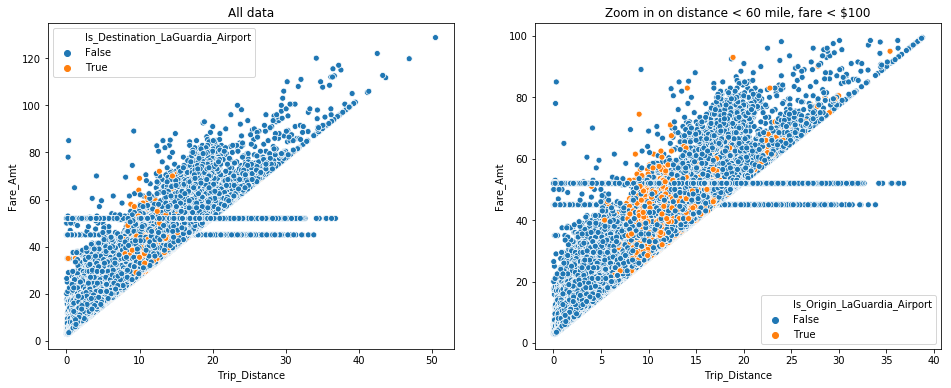

In [167]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Is_Destination_LaGuardia_Airport")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 60) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Is_Origin_LaGuardia_Airport")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### Convert Dataframe to Parquet, because the notebook would be too big later on

In [168]:
# Convert to parquet for quick reloading
# Set Path for Parquet Files
path="F:/1_Bachelorarbeit/1_Daten/1_Yellow_Cab_Trips_2009-June_2016/6_Preprocessed_Data"
gdf.to_parquet(os.path.join(path, "Preprocessed_Tripdata" + "." + "parquet"),engine="fastparquet")